In [1]:
# read the data
import matplotlib.pyplot as plt
import numpy as np
#import pandas as pd
import matplotlib
import pandas as pd
import mne 
import os
from mne.preprocessing import ICA
from scipy.stats import pearsonr
import seaborn as sns
import sys
sys.path.append(os.path.abspath('..'))
from utils import identify_bad_channels,remove_epochs_with_bad_mmn_channels, Average_in_trials_in_time_window,remove_or_interpolate_epochs_with_n_bad_chn


mne.set_log_level('WARNING')  # Options: 'DEBUG', 'INFO', 'WARNING', 'ERROR', 'CRITICAL'

# Primary functions

### ERP Ploting function

In [2]:


def plot_erps(evoked_dict, picks, stylesdict, text_labels=None, title='', ylim=(-6.2, 6.2), time_range=(-0.1, 0.7), ylabel='Evoked Responses (µV)', dpi=100,ci=True,axs = None,color = None):
    """
    Plot personalized ERP comparisons using MNE's plot_compare_evokeds with consistent formatting.

    Parameters:
    - evoked_dict: dict, keys are condition names, values are lists of evoked objects
    - picks: list of channels (e.g., ['F3', 'Cz', 'F4']), only one pick will be used per plot
    - stylesdict: dict, keys must match evoked_dict keys; values are style dicts (linewidth, linestyle)
    - colors: list of colors for each condition (must match order of evoked_dict)
    - text_labels: list of (y_position, label_text), optional, for manual line legend
    - title: string, title of the plot
    - ylim: dict or tuple, y-axis limits
    - time_range: tuple, time cropping range (e.g., (-0.1, 0.7))
    - ylabel: string, y-axis label
    - dpi: int, resolution of figure

    Returns:
    - fig, axs: matplotlib Figure and Axes objects
    """

    # Crop each evoked list to specified time range
    evokeds_subset = {}
    for cond in evoked_dict:
        evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in evoked_dict[cond]]
        evokeds_subset[cond]  =evoked_crop 
    
    # Plot
    
    if axs is None:
        fig, axs = plt.subplots(figsize=(6, 5), dpi=100)
        return_fig = True
    else:
        return_fig = False
    mne.viz.plot_compare_evokeds(
        evokeds_subset,
        picks=picks,  # Usually 'Cz'
        colors= color,
        show_sensors=False,
        legend=False,
        styles=stylesdict,
        combine='mean',
        axes=axs,
        ylim=dict(eeg=ylim),
        time_unit='ms',
        truncate_xaxis=False,
        truncate_yaxis=False,
        show=False,
        title=title,ci=ci,
    )

    # Optional manual line labels
    if text_labels:
        for y, txt,col in text_labels:
            axs.text(0.75, y, txt, transform=axs.transAxes, fontsize=18,color=col)

    axs.set_ylabel(ylabel)
    #axs.set_xticks(np.arange(0, time_range[1]*1000 + 100, 200))  # Ticks every 0.5 units
    #axs.set_yticks(np.arange(-1, 1.1, 0.2)) # Ticks every 0.2 units
    axs.grid(which='major', linestyle='-')

    # Enable minor ticks and grid
    axs.minorticks_on()
    axs.grid(which='minor', linestyle=':')
    # Set consistent font sizes
    plt.rcParams.update({
        'xtick.labelsize': 18,
        'ytick.labelsize': 18,
        'axes.labelsize': 18,
        'axes.titlesize': 18,
        'legend.fontsize': 18,
    })

    plt.tight_layout()
    
    if return_fig:
        return fig, axs
    
    else:
        return axs


### Statistical function:- Mean Aplitude 

In [3]:
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt

# Assuming your dictionaries are structured as:
# case1_dict = {'subject1': evoked_obj1, 'subject2': evoked_obj2, ...}
# case2_dict = {'subject1': evoked_obj1, 'subject2': evoked_obj2, ...}

def extract_mmn_amplitudes(case1_dict, case2_dict, time_window=(100, 250), channels=None):
    """Extract mean MMN amplitudes within the specified time window for each subject."""
    # Ensure both dictionaries have the same subjects
    common_subjects = sorted(set(case1_dict.keys()) & set(case2_dict.keys()))
    
    amplitudes_case1 = []
    amplitudes_case2 = []
    
    for subject in common_subjects:
        # Extract MMN data for the time window
        case1_data = case1_dict[subject].copy().crop(tmin=time_window[0]/1000, 
                                                     tmax=time_window[1]/1000)
        case2_data = case2_dict[subject].copy().crop(tmin=time_window[0]/1000, 
                                                     tmax=time_window[1]/1000)
        
        # Get mean amplitude for specific channels or all channels
        if channels:
            case1_amp = np.mean(case1_data.get_data(picks=channels), axis=1)
            case2_amp = np.mean(case2_data.get_data(picks=channels), axis=1)
        else:
            case1_amp = np.mean(case1_data.get_data(), axis=1)
            case2_amp = np.mean(case2_data.get_data(), axis=1)
        
        amplitudes_case1.append(case1_amp)
        amplitudes_case2.append(case2_amp)
    
    return np.array(amplitudes_case1), np.array(amplitudes_case2), common_subjects
def run_statistical_tests(case1_amps, case2_amps, channels=None):
    """Perform statistical tests on MMN amplitudes."""
    results = {}
    
    # If multiple channels, average across channels for overall test
    if case1_amps.shape[1] > 1:
        mean_case1 = np.mean(case1_amps, axis=1)
        mean_case2 = np.mean(case2_amps, axis=1)
        t_stat, p_value = stats.ttest_rel(mean_case1, mean_case2)
        results['overall'] = {'t_stat': t_stat, 'p_value': p_value}
    
    # Test each channel separately
    for i,ch in zip(range(case1_amps.shape[1]),channels):
        t_stat, p_value = stats.ttest_rel(case1_amps[:, i], case2_amps[:, i])
        results[f'channel_{ch}'] = {'t_stat': t_stat, 'p_value': p_value}
    
    return results
def visualize_results(case1_amps, case2_amps, subjects, channel_names=None,label = ("Case1",'Case2'), title = '',color = (None,None),ax = None):
    """Create visualizations to compare MMN amplitudes between cases."""
    # Calculate mean and standard error across subjects
    mean_case1 = np.mean(case1_amps, axis=0)
    mean_case2 = np.mean(case2_amps, axis=0)
    se_case1 = np.std(case1_amps, axis=0) / np.sqrt(len(subjects))
    se_case2 = np.std(case2_amps, axis=0) / np.sqrt(len(subjects))
    
    # Bar plot for each channel
    n_channels = case1_amps.shape[1]
    x = np.arange(n_channels)
    width = 0.35
    
    if ax is None:
        fig, ax = plt.subplots(figsize=(10, 6), dpi=100)
        return_fig = True
    else:
        return_fig = False
    bars1 = ax.bar(x - width/2, mean_case1, width, yerr=se_case1, label=label[0],color  = color[0])
    bars2 = ax.bar(x + width/2, mean_case2, width, yerr=se_case2, label=label[1],color  = color[1])
    
    ax.set_ylabel('Mean Amplitude (µV)')
    ax.set_title(title)
    if channel_names:
        ax.set_xticks(x)
        ax.set_xticklabels(channel_names)
    else:
        ax.set_xlabel('Channel Index')
    
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.7)
    if return_fig:
        return fig, ax
    
    else:
        return ax


### Statistical function:- Latency 

In [4]:
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt

def extract_mmn_latencies(case1_dict, case2_dict, time_window=(100, 300), channels=None, 
                          method='peak', fractional_area=0.50):
    """Extract MMN latencies using specified method."""
    common_subjects = sorted(set(case1_dict.keys()) & set(case2_dict.keys()))
    time_axis = None  # Will be determined from the first subject's data
    
    latencies_case1 = []
    latencies_case2 = []
    
    for subject in common_subjects:
        # Get the MMN evoked data for selected channels
        if channels:
            case1_data = case1_dict[subject].copy().pick_channels(channels)
            case2_data = case2_dict[subject].copy().pick_channels(channels)
        else:
            case1_data = case1_dict[subject].copy()
            case2_data = case2_dict[subject].copy()
        
        # Extract the time axis if not yet done
        if time_axis is None:
            time_axis = case1_data.times
            
        # Crop to time window of interest
        case1_data = case1_data.copy().crop(tmin=time_window[0]/1000, tmax=time_window[1]/1000)
        case2_data = case2_dict[subject].copy().crop(tmin=time_window[0]/1000, tmax=time_window[1]/1000)
        
        # Get the data as numpy arrays - average across selected channels
        case1_avg = np.mean(case1_data.data, axis=0) if len(case1_data.data.shape) > 1 else case1_data.data
        case2_avg = np.mean(case2_data.data, axis=0) if len(case2_data.data.shape) > 1 else case2_data.data
        
        # Get the time axis for this window
        window_times = case1_data.times
        
        # Extract latency based on the selected method 
        if method == 'peak':
            # Find the peak latency (time of max negative amplitude)
            peak_idx1 = np.argmin(case1_avg)
            peak_idx2 = np.argmin(case2_avg)
            lat1 = window_times[peak_idx1] * 1000  # Convert to ms
            lat2 = window_times[peak_idx2] * 1000
            
        elif method == 'fractional_area':
            # Fractional area latency (more robust against noise)
            lat1 = get_fractional_area_latency(case1_avg, window_times, fractional_area) * 1000
            lat2 = get_fractional_area_latency(case2_avg, window_times, fractional_area) * 1000
            
        elif method == 'onset':
            # Onset latency (when amplitude reaches a percentage of peak)
            percent_threshold = 0.50  # Typically 50% of peak amplitude
            lat1 = get_onset_latency(case1_avg, window_times, percent_threshold) * 1000
            lat2 = get_onset_latency(case2_avg, window_times, percent_threshold) * 1000
            
        latencies_case1.append(lat1)
        latencies_case2.append(lat2)
    
    return np.array(latencies_case1), np.array(latencies_case2), common_subjects

def get_fractional_area_latency(waveform, times, fraction=0.50):
    """Determine the latency at which a fraction of the area under the curve is reached."""
    # For MMN, we're interested in the negative area
    neg_waveform = np.minimum(waveform, 0)  # Keep only negative values, set positive to 0
    
    # Calculate cumulative area
    area = np.trapz(neg_waveform, times)
    if area >= 0:  # If no negative area (no clear MMN)
        return np.nan
        
    cumulative_area = np.zeros_like(times)
    for i in range(1, len(times)):
        cumulative_area[i] = np.trapz(neg_waveform[:i+1], times[:i+1])
    
    # Find the timepoint where the cumulative area reaches the target fraction
    threshold = fraction * area
    crossing_idx = np.argmin(np.abs(cumulative_area - threshold))
    
    return times[crossing_idx]

def get_onset_latency(waveform, times, percent_threshold=0.50):
    """Determine the onset latency when signal reaches percent_threshold of peak amplitude."""
    peak_idx = np.argmin(waveform)
    peak_amplitude = waveform[peak_idx]
    
    # Threshold is a percentage of peak amplitude
    threshold = peak_amplitude * percent_threshold
    
    # Find the first point where amplitude exceeds threshold
    for i in range(peak_idx):
        if waveform[i] <= threshold:  # For negative MMN, we use <= 
            return times[i]
    
    # If no crossing found, return NaN
    return np.nan
def run_latency_statistical_tests(case1_latencies, case2_latencies):
    """Perform statistical tests on MMN latencies."""
    # Remove any NaN values where latency couldn't be determined
    valid_indices = ~np.isnan(case1_latencies) & ~np.isnan(case2_latencies)
    valid_lat1 = case1_latencies[valid_indices]
    valid_lat2 = case2_latencies[valid_indices]
    
    # Calculate summary statistics
    mean_lat1 = np.mean(valid_lat1)
    mean_lat2 = np.mean(valid_lat2)
    std_lat1 = np.std(valid_lat1)
    std_lat2 = np.std(valid_lat2)
    
    # Paired t-test for latency differences
    t_stat, p_value = stats.ttest_rel(valid_lat1, valid_lat2)
    
    result = {
        'mean_latency_case1': mean_lat1,
        'mean_latency_case2': mean_lat2, 
        'std_latency_case1': std_lat1,
        'std_latency_case2': std_lat2,
        't_stat': t_stat,
        'p_value': p_value,
        'n_valid': len(valid_lat1)
    }
    
    return result
def visualize_latency_results(case1_latencies, case2_latencies, subjects, method_name,ax= None,color = None,label = ['','']):
    """Create visualizations to compare MMN latencies between cases."""
    valid_indices = ~np.isnan(case1_latencies) & ~np.isnan(case2_latencies)
    valid_lat1 = case1_latencies[valid_indices]
    valid_lat2 = case2_latencies[valid_indices]
    valid_subjects = [subjects[i] for i in range(len(subjects)) if valid_indices[i]]
    
    # Calculate mean and standard error
    mean_lat1 = np.mean(valid_lat1)
    mean_lat2 = np.mean(valid_lat2)
    se_lat1 = np.std(valid_lat1) / np.sqrt(len(valid_lat1))
    se_lat2 = np.std(valid_lat2) / np.sqrt(len(valid_lat2))
    
    if ax is None:
        fig, ax = plt.subplots(figsize=(8,5), dpi=100)
        return_fig = True
    else: 
        return_fig = False
    x = [1, 2]
    means = [mean_lat1, mean_lat2]
    errors = [se_lat1, se_lat2]
    
    bars = ax.bar(x, means, width=0.6, yerr=errors, capsize=10,
                 color=color, alpha=0.7)
    
    ax.set_ylabel('Latency (ms)')
    ax.set_title(f'MMN {method_name} Latency ')
    ax.set_xticks(x)
    ax.set_xticklabels(label)
    ax.grid(True, linestyle='--', alpha=0.7, axis='y') 
    
    for i, (lat1, lat2) in enumerate(zip(valid_lat1, valid_lat2)):
        ax.plot([1, 2], [lat1, lat2], 'k-', alpha=0.2)
    
    # Add individual data points
    ax.scatter([1] * len(valid_lat1), valid_lat1, color=color[0], alpha=0.6)
    ax.scatter([2] * len(valid_lat2), valid_lat2, color=color[1], alpha=0.6)
    if return_fig:
        return fig, ax
    
    else:
        return ax


### woody_align_trials

In [5]:
import numpy as np
from scipy.signal import correlate
from scipy.interpolate import interp1d
def woody_align_trials_multi_channel(epochs, channels=['Fz'], window=(0.1, 0.2), max_shift_ms=20, return_epochs=True):
    """
    Woody alignment with multi-channel support.

    Parameters:
        epochs (mne.Epochs): Input epochs
        channels (list): List of channel names for alignme nt (e.g., ['Fz', 'FCz', 'Cz'])
        window (tuple): Time window (sec) for alignment
        max_shift_ms (float): Max shift in milliseconds
        return_epochs (bool): Return EpochsArray or Evoked

    Returns:
        mne.EpochsArray or mne.Evoked
    """
    sfreq = epochs.info['sfreq']
    max_shift_samples = int((max_shift_ms / 1000) * sfreq)

    times = epochs.times
    all_data = epochs.get_data()  # shape: (n_trials, n_channels, n_times)
    n_trials, n_channels, n_times = all_data.shape
    time_vector = np.arange(n_times) / sfreq

    # Get indices of alignment channels
    ch_indices = [epochs.ch_names.index(ch) for ch in channels]

    # Average selected channels for alignment
    data_for_align = all_data[:, ch_indices, :].mean(axis=1)  # shape: (n_trials, n_times)
    template = data_for_align.mean(axis=0)

    win_start = np.argmin(np.abs(times - window[0]))
    win_end = np.argmin(np.abs(times - window[1]))

    aligned_data = np.zeros_like(all_data)
    total_shift = [] 

    for i in range(n_trials):
        trial = all_data[i]
        ref_trial = data_for_align[i]

        segment_trial = ref_trial[win_start:win_end]
        segment_template = template[win_start:win_end]

        corr = correlate(segment_trial, segment_template, mode='full')
        lags = np.arange(-len(segment_trial) + 1, len(segment_trial))
        best_lag = lags[np.argmax(corr)]
        best_lag = np.clip(best_lag, -max_shift_samples, max_shift_samples)
        shift_sec = -best_lag / sfreq
        total_shift.append(shift_sec)

        for ch in range(n_channels):
            f = interp1d(time_vector + shift_sec, trial[ch], bounds_error=False, fill_value=0.0)
            aligned_data[i, ch, :] = f(time_vector)

    if return_epochs:
        return mne.EpochsArray(aligned_data, epochs.info, tmin=epochs.tmin, events=epochs.events,
                               event_id=epochs.event_id, verbose=False),total_shift
    else:
        evoked = aligned_data.mean(axis=0)
        return mne.EvokedArray(evoked, epochs.info, tmin=epochs.tmin),total_shift



In [6]:
bad_chn = {
    'sub-sd011' : ['FT10', 'AFz', 'P5'],
    'sub-sd012' : ['FC4', 'CP2', 'C2', 'FC2', 'CP3', 'CPz', 'CP1', 'Oz', 'PO3', 'F8', 'PO8', 'F1', 'P3', 'O2', 'TP10'],
    'sub-sd013' : ['TP10', 'P3', 'FT10', 'P5'],
    'sub-sd014' : ['FT10'],
    'sub-sd015' : ['Fp1', 'PO4', 'PO8', 'FC2', 'CP1', 'T7', 'TP8'], 
    'sub-sd016' : ['F3', 'TP10', 'C1', 'FT7'],
    'sub-sd017' : ['AF7', 'CP5', 'F2', 'P1', 'PO4', 'FT7', 'T7', 'O2', 'TP8', 'AF8', 'Fz', 'FC5'],
    'sub-sd018' : ['C1', 'C5', 'CPz', 'P7', 'FC6', 'F2', 'C6'],
    'sub-sd019' : ['T8', 'T7', 'F1', 'C2', 'PO7'],
    'sub-sd020' : ['CP3', 'F3', 'CP2'],
    'sub-sd021' : ['P6', 'PO8', 'CP3', 'FC2', 'CP2', 'FC1', 'C1', 'CPz', 'F3', 'FC6', 'Pz', 'C6', 'P2', 'Fp2'],
    'sub-sd022' : ['CP5', 'P1', 'TP8', 'AF7', 'C4', 'CP1', 'O2', 'AF8', 'T7'],
    'sub-sd023' : ['PO3', 'P5', 'T7', 'T8', 'AF7', 'O2', 'CP2'],
    'sub-sd024' : ['FT10', 'FT9', 'F8', 'PO8', 'P6', 'P7', 'FC4', 'Oz', 'CP2', 'CP1', 'FC2', 'FC1', 'CP3'],
    'sub-sd025' : ['FC4', 'F8', 'P7', 'PO8', 'Oz', 'CP2', 'T7', 'CP3', 'TP10', 'FT7', 'C6', 'P2', 'F2'],
    'sub-sd026' : ['FT10', 'FCz', 'F8'],
    'sub-sd027' : ['T8', 'T7', 'POz'],
    'sub-sd028' : ['FC2', 'C2', 'CP2', 'T8', 'FC1', 'FT10', 'TP10', 'Fp1', 'PO7', 'CPz', 'F3'],
    'sub-sd029' : ['F3', 'C2', 'FC2', 'CP2', 'CPz', 'CP1', 'Oz', 'PO8'],
    'sub-sd030' : ['F3', 'Fp1', 'T8', 'F8', 'Pz', 'P6', 'CP1', 'FC4', 'CP3'],
    'sub-sd031' : ['F3', 'PO8', 'FC2', 'Oz', 'P7', 'F8', 'FC4', 'C1', 'Pz', 'P6'],
    'sub-sd032' : ['Fp1'],
    'sub-sd033' : ['TP9', 'P8', 'AF7', 'AFz', 'CP6', 'P4', 'PO3', 'PO4', 'CP5', 'P1', 'P5'],
    'sub-sd034' : ['TP10', 'T8', 'FT9', 'T7', 'Oz', 'Pz', 'Fz', 'C1', 'CPz', 'FC5', 'F8', 'CP4'],
    'sub-sd035' : ['FC3', 'AF7', 'P5', 'T8'],
    'sub-sd036' : ['AF7'],
    'sub-sd037' : ['TP8', 'T8', 'AF8', 'FT9', 'FC3', 'P1', 'C4', 'FT7', 'CP5', 'F8'],
    'sub-sd038' : ['CP2', 'T8', 'FC2', 'PO3', 'PO4', 'AF8', 'P1', 'F6', 'FT7', 'CP5', 'PO7', 'T7', 'TP8', 'C6'],
    'sub-sd039' : ['FT9', 'AFz', 'FC6', 'P1', 'P5', 'O2', 'CP5', 'PO4'],
    'sub-sd040' : ['AF7', 'TP9', 'F8', 'Fp2', 'PO3', 'AFz', 'PO4', 'F2'],
    'sub-sd041' : ['AF7', 'P8', 'PO3', 'AFz', 'FT9'], 
    'sub-sd042' : ['FT7', 'F5', 'Fp2', 'F3', 'P6', 'CP3', 'TP7'],
    'sub-sd043' : ['FT9', 'FC1', 'AF3', 'TP8', 'F3', 'TP7', 'AF4', 'TP10'],
    'sub-sd044' : ['FT9', 'FC3', 'TP10', 'C1', 'P5', 'TP9'],
    'sub-sd045' : ['PO4', 'P7', 'Fp2', 'F8', 'F2', 'CP4', 'AF7', 'P5', 'T7'],
    'sub-sd046' : ['C1', 'TP9', 'AF8', 'AF3', 'AF7', 'T8', 'FC3', 'TP7', 'P5', 'PO7', 'P4'],
    'sub-sd047' : ['PO7', 'FC3'],
    'sub-sd048' : ['C1', 'F8', 'PO3', 'CP5', 'FC3', 'AFz', 'T7'],
    'sub-sd049' : ['Fz', 'Fp1', 'FC3', 'FT9', 'TP9', 'CP2', 'P5', 'PO4'],
    'sub-sd050' : ['F4', 'C1', 'CPz', 'FC3', 'FT7', 'PO7', 'P5'],
    'sub-sd051' : ['FC3', 'FT9', 'AFz', 'P5', 'PO4'],
    'sub-sd052' : ['P7', 'AFz', 'P5', 'FC3', 'FT9', 'CP2', 'P1'],
    'sub-sd053' : ['FT9', 'C1', 'FC2', 'Fz', 'CP2', 'P5', 'P1'],
    'sub-sd054' : ['FT9', 'Oz', 'F4', 'P5', 'CP2', 'C1'],
    'sub-sd055' : ['FC3', 'CP5', 'Fp2', 'TP7'],
    'sub-sd056' : ['TP10', 'FC2', 'F4', 'C1', 'CPz', 'Oz', 'FC3'],
    'sub-sd057' : ['FC2', 'FT9', 'F4', 'Oz', 'CPz', 'C1', 'PO3', 'AF8', 'FC5'],
    'sub-sd058' : ['TP9'],
    'sub-sd059' : ['PO3', 'P6', 'T7', 'FT9', 'T8', 'TP10', 'C1', 'AF8', 'AF7', 'P5', 'F6', 'PO4'],
    'sub-sd060' : ['CP4', 'TP10', 'T7', 'CP2', 'FT8', 'P5', 'PO4', 'AF7', 'C5', 'TP9'],
    'sub-sd061' : ['Fz', 'CP1', 'PO3', 'C1', 'FC3', 'T8', 'T7', 'AF7', 'FT9', 'F5', 'AF8', 'Fp2', 'F1', 'AFz', 'Oz', 'P1'],
    'sub-sd062' : ['C1', 'FT9', 'FC3', 'FT7'],
    'sub-sd063' : ['AF7', 'AFz', 'P4', 'TP9', 'P8', 'FC5', 'F1', 'CP6', 'FC3'],
    'sub-sd064' : ['FC3', 'C1', 'FC5', 'AF7', 'P1', 'P5', 'FT8', 'FT10', 'F1', 'FC4', 'AF8'],
    'sub-sd065' : ['FC3', 'FT7', 'PO4', 'PO3', 'C1', 'FC5', 'FT9'],
    'sub-sd066' : ['AF7', 'T7', 'Fp1', 'F2', 'AFz', 'FC3', 'FT9', 'P5', 'P1'],
    'sub-sd067' : ['C1', 'Fp2', 'CP2', 'P4', 'AF8', 'TP8', 'FC5', 'PO7', 'FC4', 'CP5', 'AF4', 'O2', 'T8'],

    }

# Combined Block 1 and 2 results

['sub-sd011', 'sub-sd012', 'sub-sd013', 'sub-sd014', 'sub-sd015', 'sub-sd016', 'sub-sd017', 'sub-sd018', 'sub-sd019', 'sub-sd020', 'sub-sd021', 'sub-sd022', 'sub-sd023', 'sub-sd024', 'sub-sd025', 'sub-sd026', 'sub-sd027', 'sub-sd028', 'sub-sd029', 'sub-sd030', 'sub-sd031', 'sub-sd032', 'sub-sd033', 'sub-sd034', 'sub-sd035', 'sub-sd036', 'sub-sd037', 'sub-sd038', 'sub-sd039', 'sub-sd040', 'sub-sd041', 'sub-sd042', 'sub-sd043', 'sub-sd044', 'sub-sd045', 'sub-sd046', 'sub-sd047', 'sub-sd048', 'sub-sd049', 'sub-sd050', 'sub-sd051', 'sub-sd052', 'sub-sd053', 'sub-sd054', 'sub-sd055', 'sub-sd056', 'sub-sd057', 'sub-sd058', 'sub-sd059', 'sub-sd060', 'sub-sd061', 'sub-sd062', 'sub-sd063', 'sub-sd064', 'sub-sd065', 'sub-sd066', 'sub-sd067']
sub-sd011
sub-sd011
sub-sd011
sub-sd011
sub-sd011
sub-sd011
sub-sd011
sub-sd011
sub-sd011
sub-sd012
sub-sd012
sub-sd012
sub-sd012
sub-sd012
sub-sd012
sub-sd012
sub-sd012
sub-sd012
sub-sd013
sub-sd013
sub-sd013
sub-sd013
sub-sd013
sub-sd013
sub-sd013
sub-sd01

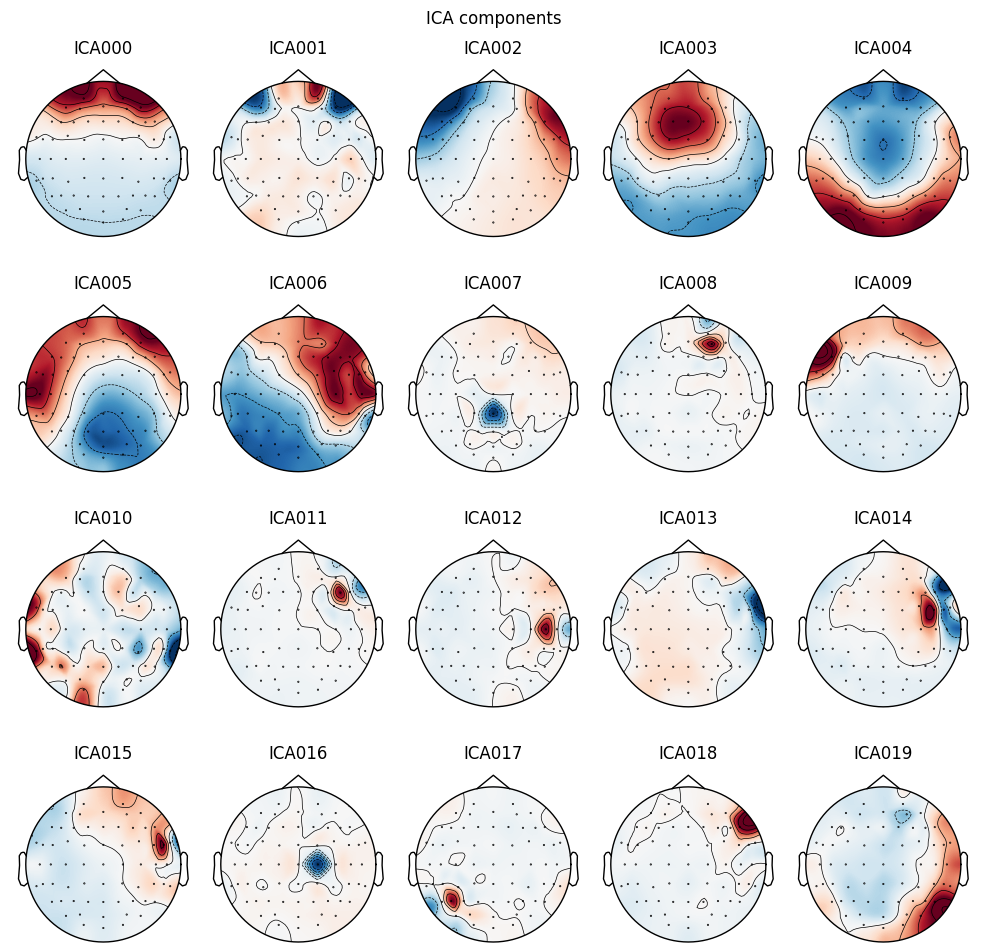

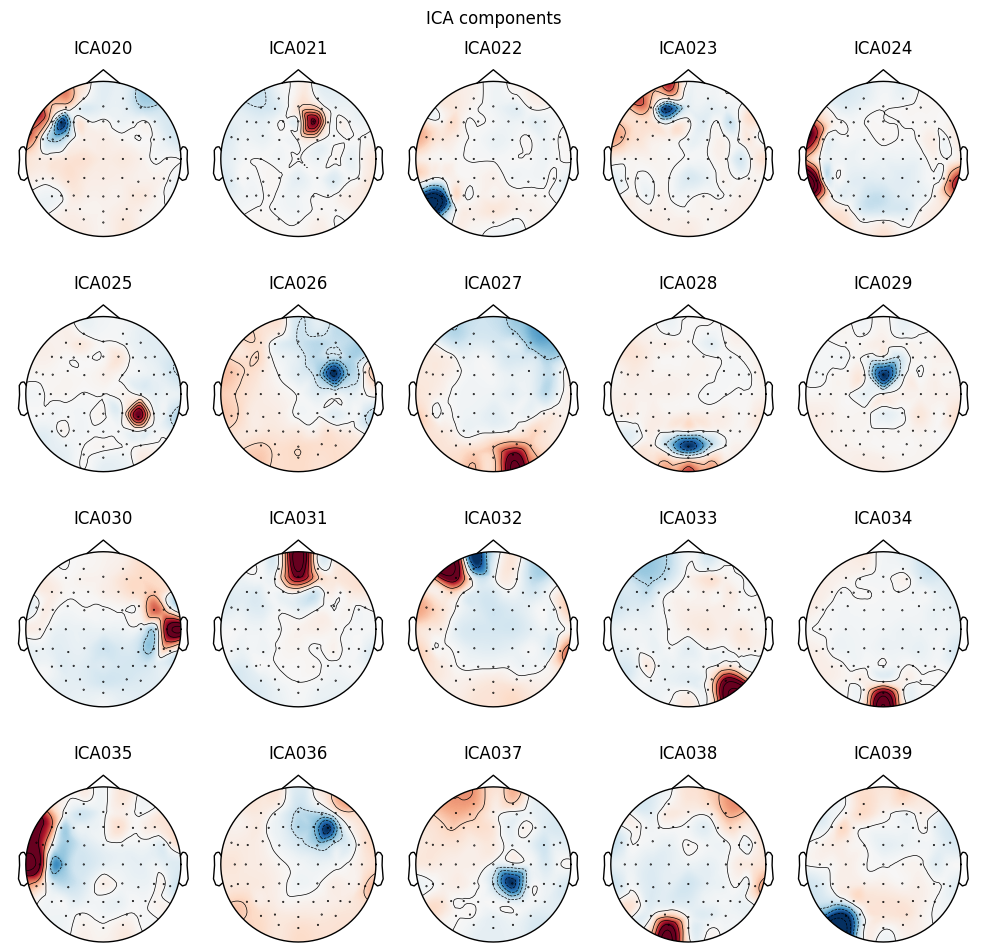

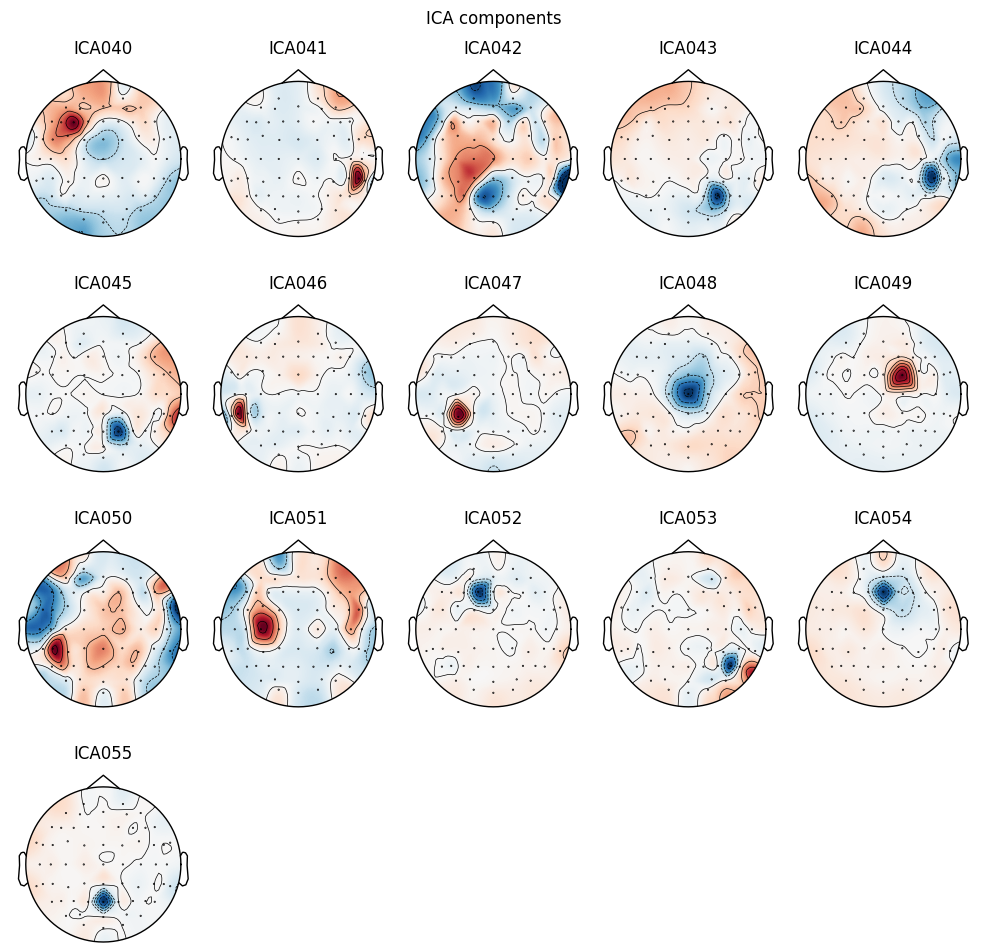

[0, 2, 5, 1] [array([ 0.98185859,  0.06038117, -0.11961482,  0.05958665, -0.007487  ,
        0.07037628,  0.01171464,  0.02776205,  0.04706618,  0.04216813,
        0.01673492,  0.02232949, -0.02073053, -0.0964391 ,  0.07922651,
       -0.00269734,  0.0276609 ,  0.0013888 , -0.01660859,  0.05793135,
       -0.05090118,  0.00186578, -0.01906909, -0.04105052,  0.04079367,
       -0.03168153, -0.04640327,  0.01879829,  0.02721188,  0.04578957,
        0.02398309, -0.03963924,  0.02277657,  0.00816876,  0.0099716 ,
       -0.00339701, -0.018627  ,  0.01368187,  0.04290018, -0.03132408,
        0.02798815, -0.01433987,  0.02578315,  0.03958868,  0.00668725,
        0.02097645,  0.06739056,  0.05072317, -0.0189883 , -0.02890338,
        0.00361426, -0.02812157,  0.00342642, -0.0066597 ,  0.00985837,
        0.00278283]), array([ 9.79064245e-01,  1.73631154e-01,  1.27208517e-02,  4.32518831e-02,
       -1.44976343e-02,  6.34184166e-02,  3.16895921e-02,  3.08841132e-02,
        5.43876371e-02

e:\ecf-exp2-notif-mmn\analysis\utils.py:188: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  data = epochs.get_data()


Epoch index 13 ; Interpolating channels ['AFz']
Epoch index 15 ; Interpolating channels ['CPz']
Epoch index 16 ; Interpolating channels ['F6']
Epoch index 17 ; Interpolating channels ['F2']
Epoch index 19 ; Interpolating channels ['F2']
Epoch index 20 ; Interpolating channels ['F2']
Epoch index 22 ; Interpolating channels ['F2']
Epoch index 28 ; Interpolating channels ['F2']
Epoch index 29 ; Interpolating channels ['F2']
Epoch index 31 ; Interpolating channels ['F2']
Epoch index 33 ; Interpolating channels ['F2']
Epoch index 34 ; Interpolating channels ['F2']
Epoch index 35 ; Interpolating channels ['F2']
Epoch index 36 ; Interpolating channels ['F2']
Epoch index 37 ; Interpolating channels ['F2']
Epoch index 38 ; Interpolating channels ['F2']
Epoch index 39 ; Interpolating channels ['F2']
Epoch index 40 ; Interpolating channels ['F2']
Epoch index 41 ; Interpolating channels ['F2']
Epoch index 42 ; Interpolating channels ['F2']
Epoch index 43 ; Interpolating channels ['F2']
Epoch index

e:\ecf-exp2-notif-mmn\analysis\utils.py:217: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  return mne.concatenate_epochs(good_epochs)
e:\ecf-exp2-notif-mmn\analysis\utils.py:217: RuntimeWarning: Event number greater than 2147483647 created, events[:, 0] will be assigned consecutive increasing integer values
  return mne.concatenate_epochs(good_epochs)


Original number of epochs: 2700
Number of epochs after removal: 2661
ERRor FOr epoching 
sub-sd065
sub-sd065
sub-sd065
sub-sd066
sub-sd066
sub-sd066
sub-sd066
sub-sd066
sub-sd066
D:\Work_data\Notification_evoked_response\Data_at_IITD/bids_data/sub-sd066\eeg\sub-sd066_task-auditoryoddball_eeg.vhdr
Marked bad channels: ['AF7', 'T7', 'Fp1', 'F2', 'AFz', 'FC3', 'FT9', 'P5', 'P1']
Interpolated: []
ICA Completed ...


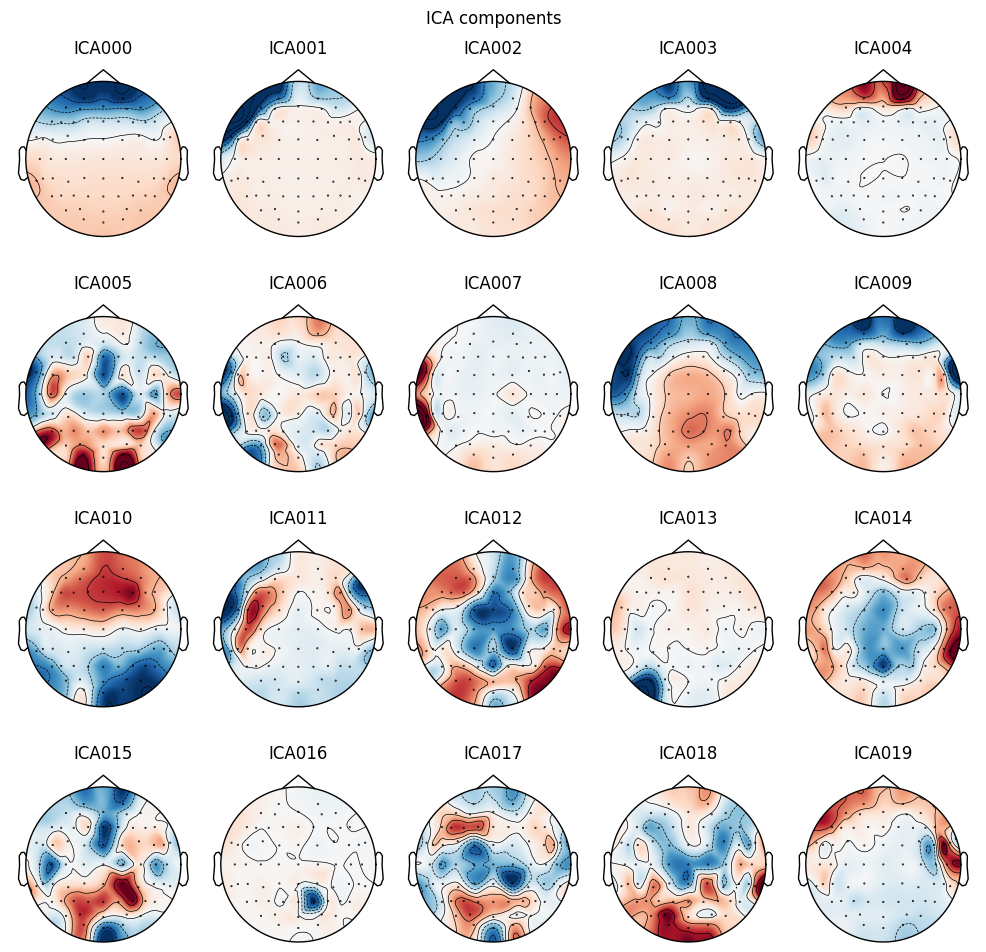

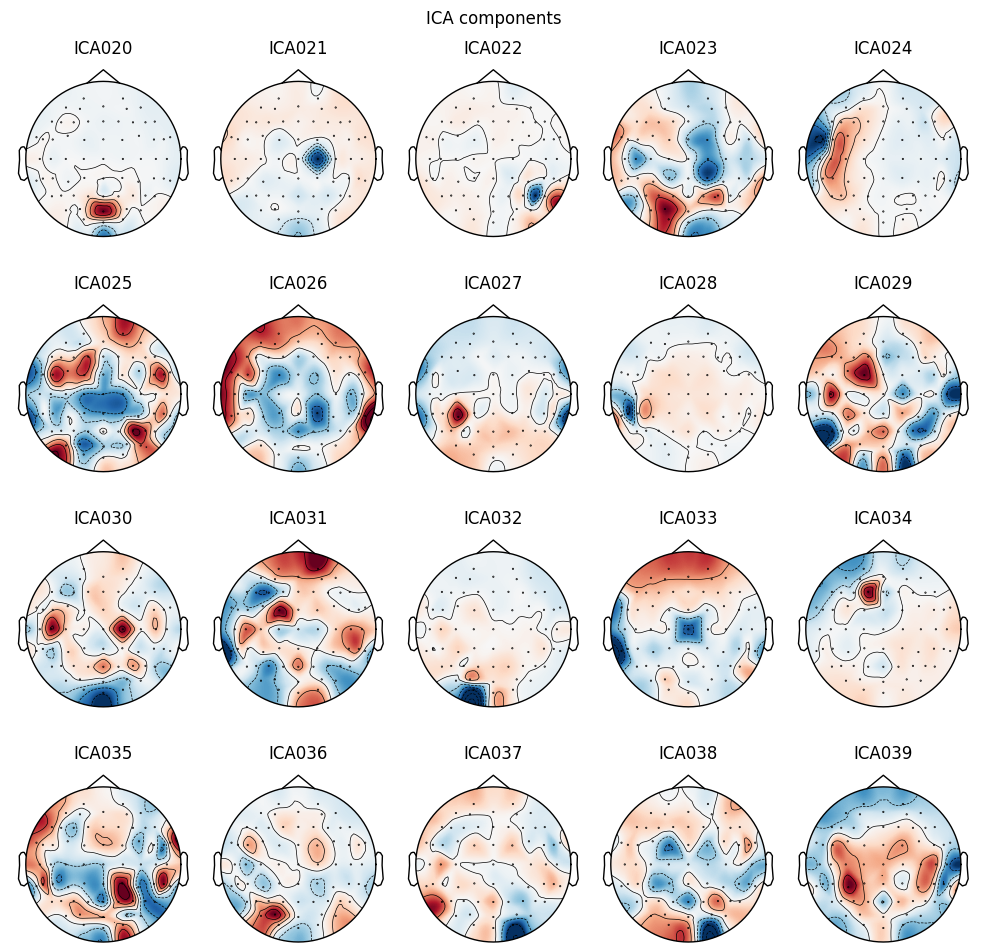

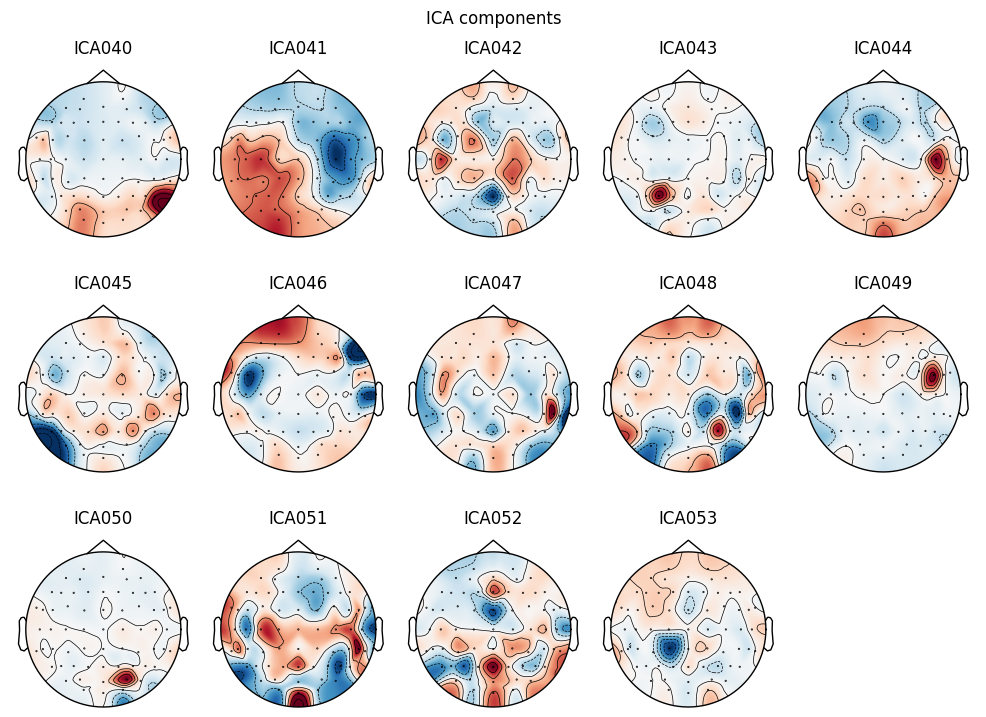

[0, 2, 3, 1, 4] [array([-0.96176419,  0.02704045, -0.22165184, -0.20070983,  0.14960021,
       -0.01699964,  0.05957583, -0.01146893, -0.03215317, -0.06542597,
        0.08404887,  0.03767096, -0.03119935,  0.04240437,  0.04355849,
       -0.00637082,  0.00525122,  0.05370276, -0.07747001, -0.00526679,
       -0.03983263,  0.03233857,  0.01052541, -0.02449419, -0.01044913,
        0.0374062 , -0.00464686, -0.00451117,  0.03441916,  0.03564928,
       -0.00619907,  0.02135965,  0.04866979, -0.1625056 , -0.137538  ,
       -0.02619737,  0.06201755,  0.06787644,  0.02121059,  0.01554067,
       -0.11559936, -0.06602622, -0.00364108,  0.07015204, -0.08436044,
       -0.04063273, -0.03209609, -0.01159774,  0.05726216,  0.01738872,
       -0.08264045,  0.03823363, -0.08273325,  0.00741017]), array([-9.83358142e-01,  8.99400432e-02, -5.15453827e-02, -2.43481830e-01,
        1.98756312e-01, -1.11927336e-02,  7.98567718e-02, -1.05631411e-02,
       -3.92413018e-02, -4.60273586e-02,  9.33940730

e:\ecf-exp2-notif-mmn\analysis\utils.py:188: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  data = epochs.get_data()


Epoch index 0 ; Interpolating channels ['TP9']
Epoch index 1 ; Interpolating channels ['TP9']
Epoch index 4 ; Interpolating channels ['TP9']
Epoch index 5 ; Interpolating channels ['TP9']
Epoch index 7 ; Interpolating channels ['CP3']
Epoch index 8 ; Interpolating channels ['CP3']
Epoch index 9 ; Interpolating channels ['CP3']
Epoch index 10 ; Interpolating channels ['CP3']
Epoch index 11 ; Interpolating channels ['CP3']
Epoch index 12 ; Interpolating channels ['CP3']
Epoch index 13 ; Interpolating channels ['CP3']
Epoch index 14 ; Interpolating channels ['CP3']
Epoch index 15 ; Interpolating channels ['CP3']
Epoch index 16 ; Interpolating channels ['CP3']
Epoch index 17 ; Interpolating channels ['CP3']
Epoch index 18 ; Interpolating channels ['CP3']
Epoch index 19 ; Interpolating channels ['CP3']
Epoch index 20 ; Interpolating channels ['CP3']
Epoch index 23 ; Interpolating channels ['CP3']
Epoch index 24 ; Interpolating channels ['CP3']
Epoch index 25 ; Interpolating channels ['CP3']

e:\ecf-exp2-notif-mmn\analysis\utils.py:217: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  return mne.concatenate_epochs(good_epochs)
e:\ecf-exp2-notif-mmn\analysis\utils.py:217: RuntimeWarning: Event number greater than 2147483647 created, events[:, 0] will be assigned consecutive increasing integer values
  return mne.concatenate_epochs(good_epochs)


Original number of epochs: 2700
Number of epochs after removal: 2606
ERRor FOr epoching 
sub-sd066
sub-sd066
sub-sd066
sub-sd067
sub-sd067
sub-sd067
sub-sd067
sub-sd067
sub-sd067
D:\Work_data\Notification_evoked_response\Data_at_IITD/bids_data/sub-sd067\eeg\sub-sd067_task-auditoryoddball_eeg.vhdr
Marked bad channels: ['C1', 'Fp2', 'CP2', 'P4', 'AF8', 'TP8', 'FC5', 'PO7', 'FC4', 'CP5', 'AF4', 'O2', 'T8']
Interpolated: []
ICA Completed ...


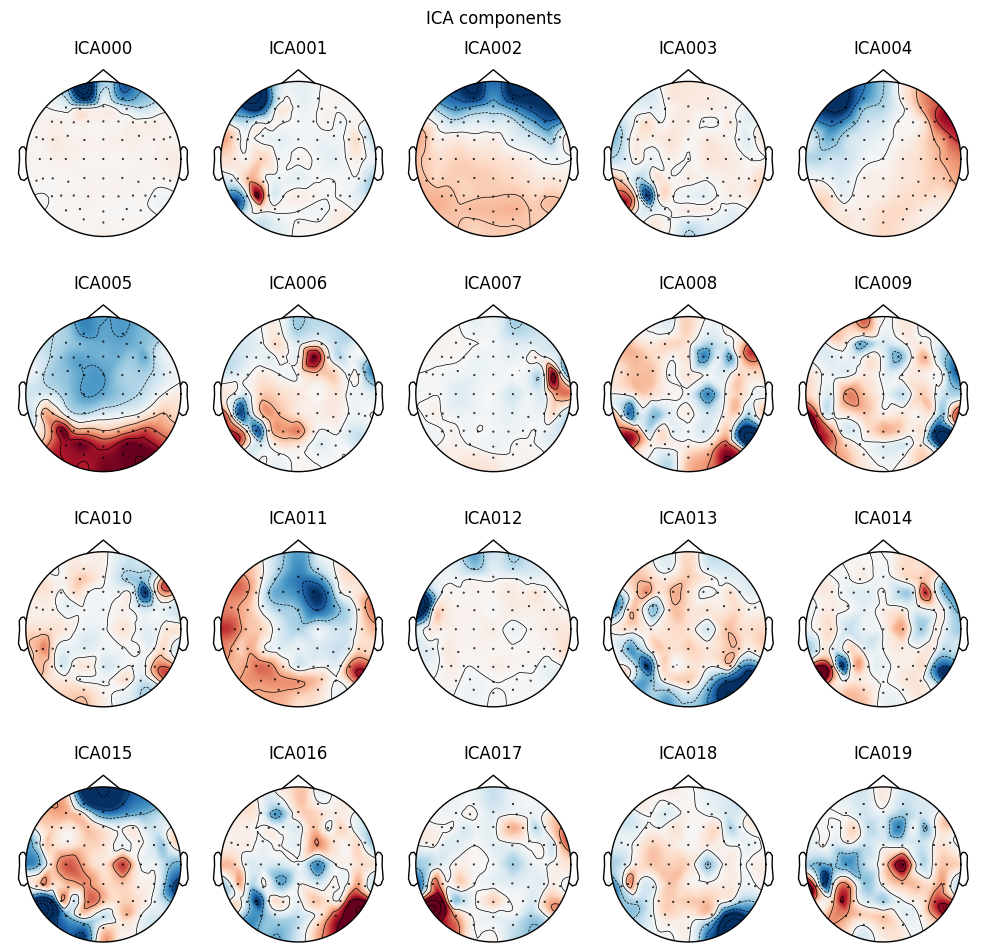

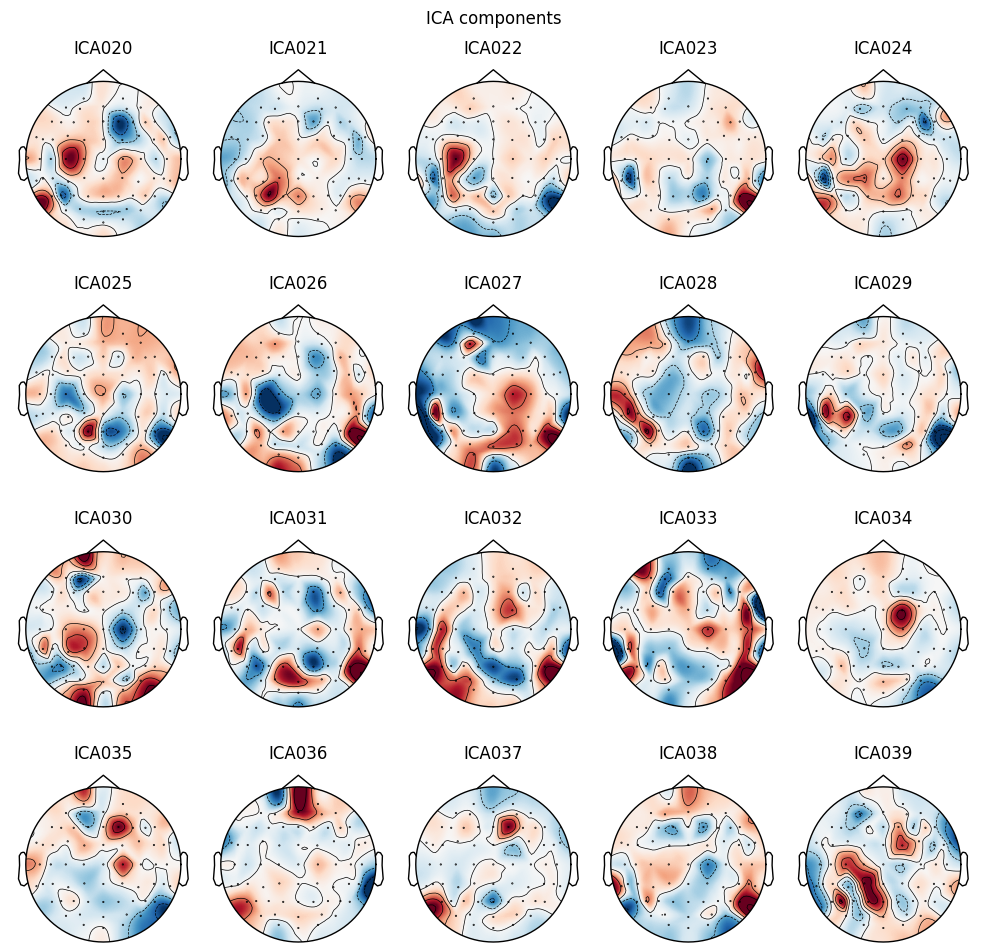

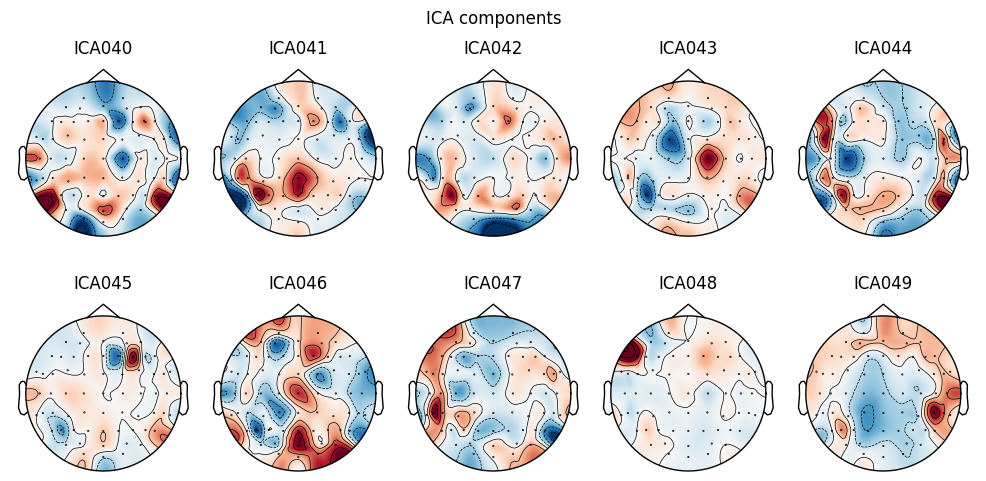

[2, 1, 4, 0] [array([-0.48957689, -0.09323814, -0.67350937,  0.06707781, -0.36751761,
       -0.17763489, -0.18100942, -0.0204023 ,  0.05522281, -0.09547806,
        0.07762905, -0.091146  , -0.02727818, -0.01361331, -0.14887737,
       -0.09672426, -0.09014327,  0.12518997, -0.10500436, -0.1955387 ,
       -0.0042431 , -0.18515172, -0.00162427, -0.12240158, -0.16577752,
       -0.04385704,  0.01771985, -0.17996489, -0.06251432, -0.09515419,
       -0.02164208,  0.04534684, -0.13549004, -0.09521015,  0.14837635,
        0.04210427, -0.07924265,  0.09856845,  0.08980412, -0.17669902,
       -0.05916216, -0.16588889,  0.01688455,  0.03515183,  0.01890245,
       -0.14373064, -0.07659907, -0.0240018 ,  0.02667616,  0.0432222 ]), array([-3.14851079e-01, -1.75351446e-02, -8.09104245e-01,  3.29461193e-02,
       -6.77388329e-02, -1.87808875e-01, -2.82509003e-01, -1.46233997e-01,
        7.91069026e-03, -1.33905801e-01, -8.30287664e-03, -1.74357612e-01,
       -5.43827705e-02, -7.07724347e-03

e:\ecf-exp2-notif-mmn\analysis\utils.py:188: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  data = epochs.get_data()


Epoch index 8 ; Interpolating channels ['P5']
Epoch index 9 ; Interpolating channels ['P3']
Epoch index 11 ; Interpolating channels ['P5']
Epoch index 15 ; Interpolating channels ['P3']
Epoch index 16 ; Interpolating channels ['P3']
Epoch index 19 ; Interpolating channels ['P5']
Epoch index 25 ; Interpolating channels ['FT8']
Epoch index 55 ; Interpolating channels ['Fp1']
Epoch index 63 ; Interpolating channels ['Fp1']
Epoch index 65 ; Interpolating channels ['P3']
Epoch index 66 ; Interpolating channels ['P3']
Epoch index 70 ; Interpolating channels ['TP7']
Epoch index 74 ; Interpolating channels ['P5']
Epoch index 79 ; Interpolating channels ['FT9']
Epoch index 80 ; Interpolating channels ['FT9']
Epoch index 81 ; Interpolating channels ['FT9']
Epoch index 82 ; Interpolating channels ['FT9', 'P5']
Epoch index 83 ; Interpolating channels ['FT9', 'P5']
Epoch index 84 ; Interpolating channels ['FT9']
Epoch index 95 ; Interpolating channels ['P5']
Epoch index 103 ; Interpolating channels

e:\ecf-exp2-notif-mmn\analysis\utils.py:217: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  return mne.concatenate_epochs(good_epochs)
e:\ecf-exp2-notif-mmn\analysis\utils.py:217: RuntimeWarning: Event number greater than 2147483647 created, events[:, 0] will be assigned consecutive increasing integer values
  return mne.concatenate_epochs(good_epochs)


Original number of epochs: 2700
Number of epochs after removal: 2671
ERRor FOr epoching 
sub-sd067
sub-sd067
sub-sd067


In [ ]:

data_folder = r"D:\Work_data\Notification_evoked_response\Data_at_IITD/bids_data/"
subjects = [sub for sub in os.listdir(data_folder) if (("sub-" in sub) & (os.path.isdir(os.path.join(data_folder,sub))))]
print(subjects)
folder = r"E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\CAR"

data_type = "eeg"
 # it is useful to scroll eeg data 
B1_MMN_erp_evoked_dict  = {} 
PN_devi_eps_evoked_dict  = {}
BN_sta_eps_evoked_dict  = {}
BN_devi_eps_evoked_dict = {}
PN_sta_eps_evoked_dict = {}
B2_MMN_erp_evoked_dict = {}
CN_devi_eps_evoked_dict = {}
CN_sta_eps_evoked_dict = {}
B1_sub_epoch_num = {}
B2_sub_epoch_num = {}
woody_shift_time = {
    "SN_devi":dict(),
    "SN_sta" : dict(),
    "BN_devi" : dict(),
    "BN_sta" : dict(),
}
B3_sub_epoch_num = {}
epoch_per_num = {"subject Dropped":[]}
for sub in subjects:
    path = os.path.join(data_folder,sub,data_type)
    
    for eeg in os.listdir(path):
        print(sub)
        num = int(sub.split("sd")[-1]) 
        if eeg[-5:] == ".vhdr" and num >58:
            if   sub   in  ['sub-sd041']: #  ['sub-sd041','sub-sd046','sub-sd058']
                continue
               
            raw = mne.io.read_raw_brainvision(os.path.join(path,eeg), preload=True)
            print(os.path.join(path,eeg))
            #raw = mne.add_reference_channels(raw, ref_channels=["Cz"])
            raw.set_montage("easycap-M1")
            #raw.plot(scalings=dict(eeg=40e-6),clipping='transparent',duration=30.0, start=690.0, n_channels=63,color = "Blue",event_color ='black',show_options=True )
            # Now re-reference the data :-n average reference 
            #
            raw.info['bads'] = bad_chn[sub]
            print("Marked bad channels:", raw.info['bads'])
            # 3. Interpolate bad channels
            raw.interpolate_bads(reset_bads=True)
            print("Interpolated:", raw.info['bads'])
            #raw.set_eeg_reference(ref_channels=['TP9', 'TP10'])
            raw.set_eeg_reference('average')
            raw.resample(512) 
            # filter 
            raw.filter(l_freq=0.1,h_freq=30)
            #ICA  
            ica = ICA(n_components=None, random_state=97,max_iter=500)
            ica.fit(raw) 
            print("ICA Completed ...")
            ica.plot_components()
            #removing Eye movement artifacts 
            eog_channels = ['Fp1', 'Fp2',"AF7","AF8",'F7', 'F8']  # Adjust these to match your channel names
            eog_indices, eog_scores = ica.find_bads_eog(raw, ch_name=eog_channels)
            print(eog_indices, eog_scores)
            ica.exclude = eog_indices[:3]
            ica.apply(raw)
            #raw.plot(scalings=dict(eeg=40e-6),clipping='transparent',duration=30.0, start=690.0, n_channels=63,color = "Blue" )
            events,event_dict = mne.events_from_annotations(raw)
            #   print(events,event_dict)
            # Create Epochs without droping the eye blink event
            try: 
                
                S14= event_dict['Stimulus/S   14']
                S15 = event_dict['Stimulus/S   15']
                S24 = event_dict['Stimulus/S   24']
                S25 = event_dict['Stimulus/S   25']
                S34 = event_dict['Stimulus/S   34']
                S35 = event_dict['Stimulus/S   35']
                
            
                
                
                epochs = mne.Epochs(raw, events, event_id=[ S14,S15,S24,S25, S34,S35],baseline=(None, 0), tmin=-0.300, tmax=0.900,preload=True,event_repeated='merge')
                epochs.drop_channels(['GSR', 'PPG'])
                # CN_epochs.drop_channels(['GSR', 'PPG'])
                # CN_cleaned_epochs = remove_or_interpolate_epochs_with_n_bad_chn(CN_epochs,  bad_chn_threshold = 6, amplitude_threshold=75e-6)
                # #CN_cleaned_epochs = remove_epochs_with_bad_mmn_channels(CN_epochs, mmn_channels, amplitude_threshold=80e-6)
                # CN_devi_eps = CN_cleaned_epochs[str(S35)].average()
                # CN_sta_eps = CN_cleaned_epochs[str(S34)].average()
                # CN_devi_eps_evoked_dict[sub] = CN_devi_eps
                # CN_sta_eps_evoked_dict[sub] = CN_sta_eps
                # B3_sub_epoch_num[sub] =len(cleaned_epochs[ tr(S34),str(S35)])
            except:                                  
                print("NO PPG sensor")
                
                S14= event_dict['Stimulus/S   14'] 
                S15 = event_dict['Stimulus/S   15']
                S24 = event_dict['Stimulus/S   24']
                S25 = event_dict['Stimulus/S   25']
                epochs = mne.Epochs(raw, events, event_id=[S14,S15,S24,S25],baseline=(None, 0), tmin=-0.300, tmax=0.900, preload=True,event_repeated='merge')
                pass
            cleaned_epochs = remove_or_interpolate_epochs_with_n_bad_chn(epochs,  bad_chn_threshold = 6, amplitude_threshold=75e-6)
            #cleaned_epochs = remove_epochs_with_n_bad_channels(epochs, bad_chn_thresold = 8, amplitude_threshold=80e-6)
            #cleaned_epochs = remove_epochs_with_bad_mmn_channels(epochs, mmn_channels, amplitude_threshold=80e-6)
            """if len(cleaned_epochs[str(S14),str(S15)]) < 450 or  len(cleaned_epochs[str(S24),str(S25)]) < 450 :
                epoch_per_num["subject Dropped"].append(sub)  
                print("B1 len :",len(cleaned_epochs[str(S14),str(S15)]),"B2 len :",len(cleaned_epochs[str(S24),str(S25)]))
                continue"""

            print(f"Original number of epochs: {len(epochs)}")
            print(f"Number of epochs after removal: {len(cleaned_epochs)}")
            cleaned_epochs.reset_drop_log_selection()
            cleaned_epochs.save(f'{os.path.join(folder,sub)}CAR-epo.fif', overwrite=True)
            try:
                #PN_devi_eps,woody_shift_time['SN_devi'][sub] =woody_align_trials_multi_channel(cleaned_epochs[str(S15)], channels=['Fz', 'FCz', 'Cz'], window=(0.100, 0.300), max_shift_ms=50, return_epochs=False)
                #BN_sta_eps,woody_shift_time['BN_sta'][sub] = woody_align_trials_multi_channel(cleaned_epochs[str(S14)], channels=['Fz', 'FCz', 'Cz'], window=(0.100, 0.300), max_shift_ms=50, return_epochs=False)
                
                #mne.viz.plot_compare_evokeds(evokeds, picks=picks,title  = str (sub) + " BLock1 avaerage 'F3', 'Fz', 'F4'", combine="mean")

                # Block 2 

                #BN_devi_eps,woody_shift_time['BN_devi'][sub] = woody_align_trials_multi_channel(cleaned_epochs[str(S25)], channels=['Fz', 'FCz', 'Cz'], window=(0.100, 0.300), max_shift_ms=50, return_epochs=False)
                #PN_sta_eps,woody_shift_time['SN_sta'][sub]  =woody_align_trials_multi_channel(cleaned_epochs[str(S24)], channels=['Fz', 'FCz', 'Cz'], window=(0.100, 0.300), max_shift_ms=50, return_epochs=False)
                PN_devi_eps = cleaned_epochs['S15'].average()
                BN_sta_eps = cleaned_epochs['S14'].average()
                B1_MMN_erp = mne.combine_evoked([ PN_devi_eps,BN_sta_eps], weights=[1,-1])
            
                PN_devi_eps_evoked_dict[sub] = PN_devi_eps 
                BN_sta_eps_evoked_dict[sub] = BN_sta_eps
                B1_MMN_erp_evoked_dict[sub] = B1_MMN_erp
                B1_sub_epoch_num[sub] = {"BN_std":len(cleaned_epochs['S14']) , "PN_deviant": len(cleaned_epochs['S15'])}
                #mne.viz.plot_compare_evokeds(evokeds, picks=picks,title  = str (sub) + " BLock1 avaerage 'F3', 'Fz', 'F4'", combine="mean")

                # Block 2 

                BN_devi_eps = cleaned_epochs['S25'].average() 
                PN_sta_eps = cleaned_epochs['S24'].average()    
                B2_MMN_erp = mne.combine_evoked( [ BN_devi_eps,PN_sta_eps], weights=[1,-1]) 
            
                BN_devi_eps_evoked_dict[sub] = BN_devi_eps
                PN_sta_eps_evoked_dict[sub] = PN_sta_eps  
                B2_MMN_erp_evoked_dict[sub] = B2_MMN_erp
                B2_sub_epoch_num[sub] = {"PN_std":len(cleaned_epochs['S24']) , "BN_deviant": len(cleaned_epochs['S15'])}
            except:   
                print("ERRor FOr epoching ")    


In [8]:
print(sub)

sub-sd067


In [9]:
eog_indices = eog_indices[:2]
eog_indices[:3] 

[2, 1]

### identify the bad subjects based on the Epoch

In [10]:
B1_sub = [sub for  sub in  B1_sub_epoch_num if B1_sub_epoch_num[sub] <450]
B2_sub = [sub for  sub in  B2_sub_epoch_num if B2_sub_epoch_num[sub] <450]
B1_sub.extend(B2_sub)
bad_subs  = list(set(B1_sub))

In [11]:
bad_subs 

[]

### Collecting all ERps 


In [12]:
PN_MMN_evokeds_dict = {sub1:mne.combine_evoked([PN_devi_eps_evoked_dict[sub1], PN_sta_eps_evoked_dict[sub1]], weights=[1, -1])
    for sub1,sub2 in zip(PN_devi_eps_evoked_dict,PN_sta_eps_evoked_dict) if sub1== sub2 and sub1 not in bad_subs}  
BN_MMN_evokeds_dict = {sub1:mne.combine_evoked([BN_devi_eps_evoked_dict[sub1], BN_sta_eps_evoked_dict[sub1]], weights=[1, -1])
    for sub1,sub2 in zip(BN_devi_eps_evoked_dict,BN_sta_eps_evoked_dict) if sub1== sub2 and sub1 not in bad_subs}  
CN_MMN_evokeds_dict = {sub1:mne.combine_evoked([CN_devi_eps_evoked_dict[sub1], CN_sta_eps_evoked_dict[sub1]], weights=[1, -1])
    for sub1,sub2 in zip(CN_devi_eps_evoked_dict,CN_sta_eps_evoked_dict) if sub1== sub2 and sub1 not in bad_subs}  

In [13]:
len(PN_MMN_evokeds_dict), len(PN_MMN_evokeds_dict),len(CN_MMN_evokeds_dict)

(0, 0, 0)

# MMN Plots for total subjects 

In [14]:


stylesdict ={"std": {"linewidth": 2.5,"linestyle":'dotted'},
             'deviant' : {"linewidth": 2.5,"linestyle":'--'},
             'MMN': {"linewidth": 2.5,"linestyle":'solid'},
             }
text_labels = [
    (0.90, "... std",'black'),
    (0.83, f"--- deviant",'black'),
    (0.75, f"__ MMN ",'black'),
]


#picks = ["Fz", 'FCz', 'Cz' ,'F1', 'F2', 'C1', 'C2', 'FC1','FC2','F3', 'F4', 'C3', 'C4', 'FC3','FC4']

picks = ["Fz", 'FCz', 'Cz' ]
# Example usage with subplots
fig, axs = plt.subplots(1, 3, figsize=(15, 5), dpi=100)

# Define BN ERPs comparison
BN_evokeds = {
           'std': [evk for sub,evk in BN_sta_eps_evoked_dict.items() if sub not in bad_subs],
           'deviant':[evk for  sub,evk in BN_devi_eps_evoked_dict.items() if sub not in bad_subs],
           'MMN': [evk for  sub,evk in BN_MMN_evokeds_dict.items() ] ,
                      }
 
plot_erps(BN_evokeds, picks=picks ,
                                   stylesdict=stylesdict,time_range = (-.200,600),
                                   text_labels=text_labels,ci=False,title="BN MMN",axs=axs[0],color=['purple']*3)

# Define PN ERPs comparison
PN_evokeds = {
           'std': [evk for sub,evk in PN_sta_eps_evoked_dict.items() if sub not in bad_subs],
           'deviant':[evk for  sub,evk in PN_devi_eps_evoked_dict.items() if sub not in bad_subs],
           'MMN': [evk for  sub,evk in PN_MMN_evokeds_dict.items()] ,
                      }
 
plot_erps(PN_evokeds, picks=picks ,
                                   stylesdict=stylesdict,time_range = (-.200,600),
                                   text_labels=text_labels,ci=False,title="PN MMN",axs=axs[1],color=['green']*3)
# Define BN vs PN ERPs comparison
MMN_evokeds = {
           'PN': [evk for  sub,evk in PN_MMN_evokeds_dict.items()] ,
           'BN':[evk for  sub,evk in BN_MMN_evokeds_dict.items()] ,
                      }
stylesdict ={"BN": {"linewidth": 2.5,"linestyle":'solid','color': 'purple'},
             'PN': {"linewidth": 2.5,"linestyle":'solid','color': 'green'},
             }
text_labels = [
    (0.90, "BN",'purple'),
    (0.83, f"SN",'green'),
] 
plot_erps(MMN_evokeds, picks=picks ,
                                   stylesdict=stylesdict,time_range = (-.200,600),
                                   text_labels=text_labels,title="MMN",axs=axs[2])
plt.tight_layout()
plt.show()

IndexError: list index out of range

### Topo Plots

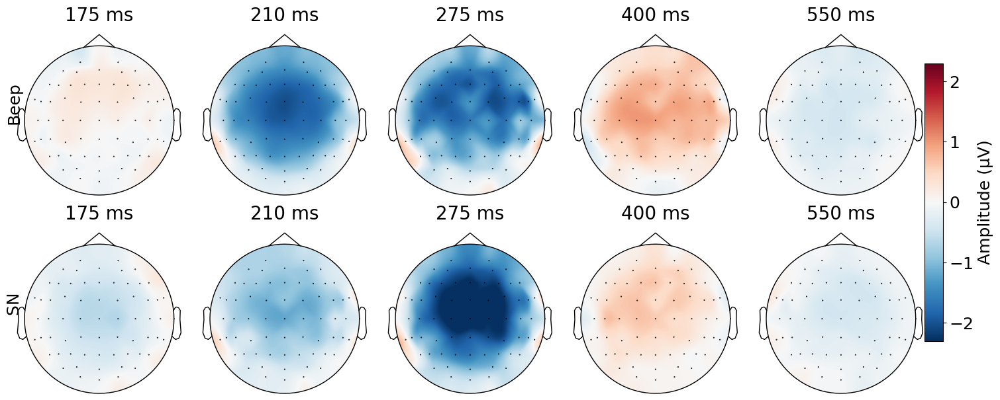

In [ ]:
import matplotlib as mpl
# Define time points
time_points = [.175, .210,.275,.400, .550,]

# Set the color scale range
vlim = (-2.3, 2.3)  # Adjust based on your data

# Create a grid of subplots
fig, axes = plt.subplots(2, len(time_points), figsize=(14, 6), constrained_layout=True)

# To store the last 'im' object for the colorbar
im = None

# Plot topomaps for the first evoked (Personal_MMN_erp)
for i, time in enumerate(time_points):
    mne.grand_average([evk for  sub,evk in BN_MMN_evokeds_dict.items() ]).copy().plot_topomap(
        times=[time], axes=axes[0, i], colorbar=False, vlim=vlim, show=False,contours = 0,
    )
    axes[0, i].set_title(f"{time * 1000:.0f} ms",fontsize=20)

# Plot topomaps for the second evoked (B1_MMN_erp)
for i, time in enumerate(time_points):
    im= mne.grand_average([evk for  sub,evk in PN_MMN_evokeds_dict.items() ]).copy().plot_topomap(
        times=[time], axes=axes[1, i], colorbar=False, vlim=vlim, show=False,contours = 0,
    ) 
    axes[1, i].set_title(f"{time * 1000:.0f} ms",fontsize=20)

# Generate a shared colorbar
cbar_ax = fig.add_axes([0.99, 0.15, 0.02, 0.7])  # Position for the colorbar
norm = mpl.colors.Normalize(vmin=vlim[0], vmax=vlim[1])  # Normalize color scale
cmap = mpl.colormaps['RdBu_r']  # Choose a colormap (like 'RdBu_r')

# Add the colorbar
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
fig.colorbar(sm, cax=cbar_ax, orientation='vertical', label='Amplitude (µV)')

# Add row labels
fig.text(0.0001, 0.75, 'Beep', fontsize=18, rotation=90, va='center')
fig.text(0.0001, 0.25, 'SN ', fontsize=18   , rotation=90, va='center')

plt.show()

### Statistical test 

#### Amplitude 

In [ ]:
plt.rcParams.update({
        'xtick.labelsize': 18,
        'ytick.labelsize': 18,
        'axes.labelsize': 18,
        'axes.titlesize': 18,
        'legend.fontsize': 18,
    })
def df_convert(case1_amps, case2_amps, label=("Case1", "Case2"), title='', df_type = "Amplitude"):
    n_subjects, n_channels = case1_amps.shape
    data = pd.DataFrame({
        df_type: np.concatenate([case1_amps.flatten(), case2_amps.flatten()]),
        'Case': np.repeat([label[0], label[1]], n_subjects * n_channels),

    })
    
    return data

In [ ]:
PN_MMN_evokeds_dict

{'sub-sd011': <Evoked | 'unknown - unknown' (average, N=0.5), -0.30078 – 0.69922 s, baseline off, 64 ch, ~336 kB>,
 'sub-sd012': <Evoked | 'unknown - unknown' (average, N=0.5), -0.30078 – 0.69922 s, baseline off, 64 ch, ~336 kB>,
 'sub-sd013': <Evoked | 'unknown - unknown' (average, N=0.5), -0.30078 – 0.69922 s, baseline off, 64 ch, ~336 kB>,
 'sub-sd014': <Evoked | 'unknown - unknown' (average, N=0.5), -0.30078 – 0.69922 s, baseline off, 64 ch, ~336 kB>,
 'sub-sd015': <Evoked | 'unknown - unknown' (average, N=0.5), -0.30078 – 0.69922 s, baseline off, 64 ch, ~336 kB>,
 'sub-sd016': <Evoked | 'unknown - unknown' (average, N=0.5), -0.30078 – 0.69922 s, baseline off, 64 ch, ~336 kB>,
 'sub-sd017': <Evoked | 'unknown - unknown' (average, N=0.5), -0.30078 – 0.69922 s, baseline off, 64 ch, ~336 kB>,
 'sub-sd018': <Evoked | 'unknown - unknown' (average, N=0.5), -0.30078 – 0.69922 s, baseline off, 64 ch, ~336 kB>,
 'sub-sd019': <Evoked | 'unknown - unknown' (average, N=0.5), -0.30078 – 0.69922

Statistical test results:
overall: t=-0.594, p=0.555
channel_Fz: t=-0.229, p=0.820
channel_FCz: t=-0.615, p=0.541
channel_Cz: t=-0.899, p=0.373
Statistical test results:
overall: t=-0.696, p=0.490
channel_Fz: t=-0.445, p=0.658
channel_FCz: t=-0.689, p=0.494
channel_Cz: t=-0.860, p=0.394


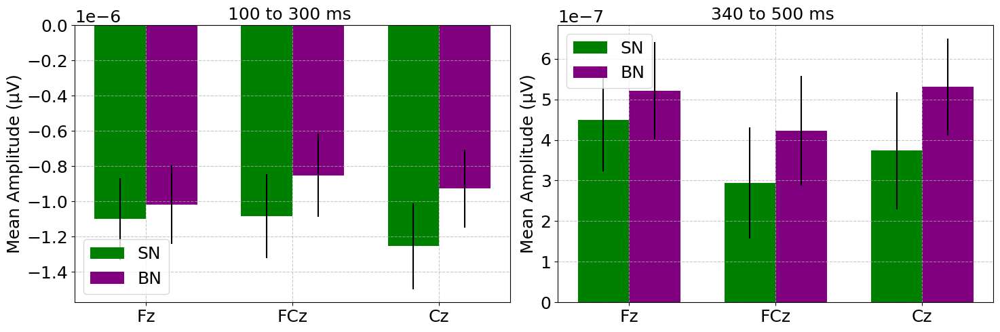

In [ ]:
time_window = (135, 325)  # MMN typically 100-250ms
channels = picks  # Common MMN channels

# Extract amplitudes
PN_amps, BN_amps, subjects = extract_mmn_amplitudes(
    PN_MMN_evokeds_dict ,BN_MMN_evokeds_dict , time_window=time_window, channels=channels
)

# Run statistical tests
results = run_statistical_tests(PN_amps, BN_amps,channels= channels)
print("Statistical test results:")
for key, data in results.items():
    print(f"{key}: t={data['t_stat']:.3f}, p={data['p_value']:.3f}")

# Visualize
fig, axs = plt.subplots(1, 2, figsize=(15, 5), dpi=100)
fig = visualize_results(PN_amps, BN_amps, subjects, channel_names=channels,label= ("SN",'BN'),color=("green",'purple'),ax = axs[0],title= '100 to 300 ms ')

PN_amps, BN_amps, subjects = extract_mmn_amplitudes(
    PN_MMN_evokeds_dict ,BN_MMN_evokeds_dict , time_window=(340,500), channels=channels
)

# Run statistical tests
results = run_statistical_tests(PN_amps, BN_amps,channels= channels)
print("Statistical test results:")
for key, data in results.items():
    print(f"{key}: t={data['t_stat']:.3f}, p={data['p_value']:.3f}")
fig = visualize_results(PN_amps, BN_amps, subjects, channel_names=channels,label= ("SN",'BN'),color=("green",'purple'),ax = axs[1],title= '340 to 500 ms ')
plt.tight_layout()
plt.show()


t_stat [-0.89944082] with , p_value [0.3725643]


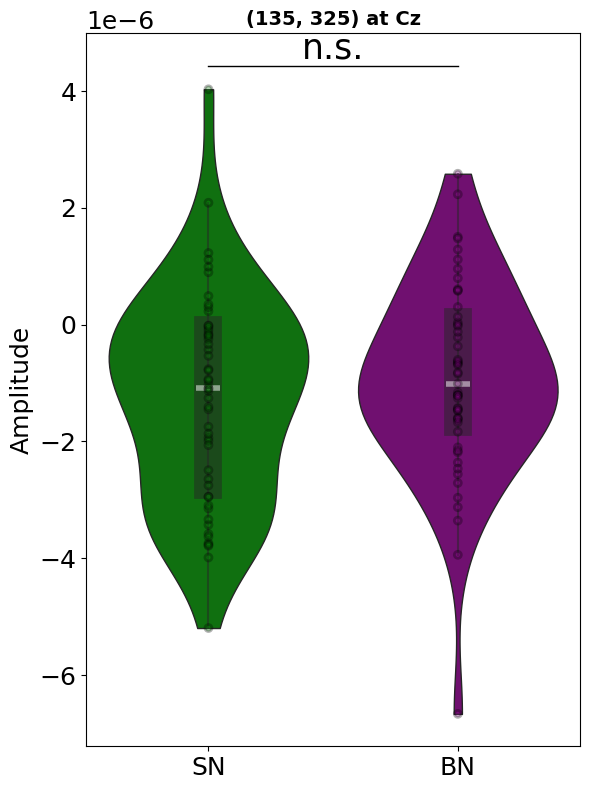

In [ ]:
# Extract Latency
df_type = "Amplitude"
# Set up the plot
channels = ['Cz']  # Common MMN channels
time_window = (135, 325)
# Extract amplitudes
PN_amps, BN_amps, subjects = extract_mmn_amplitudes(
    PN_MMN_evokeds_dict ,BN_MMN_evokeds_dict , time_window=time_window, channels=channels
)
df = df_convert(PN_amps, BN_amps,label=("SN", "BN") ,df_type = df_type)


fig, ax = plt.subplots(1,1 , figsize=(6,8), )
sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=["green", "purple"],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=["green", "purple"], edgecolor='black',dodge=False,ax= ax)

y_offset = 1.e-09
y_max = max(df[df_type]) *1.1
t_stat, p_value = stats.ttest_rel(PN_amps, BN_amps)
print(f't_stat {t_stat } with , p_value { p_value}')
ax.plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax.text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
plt.title(f"{time_window} at {channels[0]}", fontsize=14, weight='bold')
plt.xlabel("")
plt.ylabel(df_type)
#ax.set_xticklabels(["PN", "BN"])
plt.tight_layout()
plt.show()



#### Latency 

Peak Latency Results:
PN: 240.4 ± 40.0 ms
BN: 249.9 ± 27.5 ms
t(52) = -1.437, p = 0.157

Fractional Area Latency Results:
SN: 239.7 ± 27.2 ms
BN: 244.6 ± 21.3 ms
t(49) = -1.038, p = 0.305


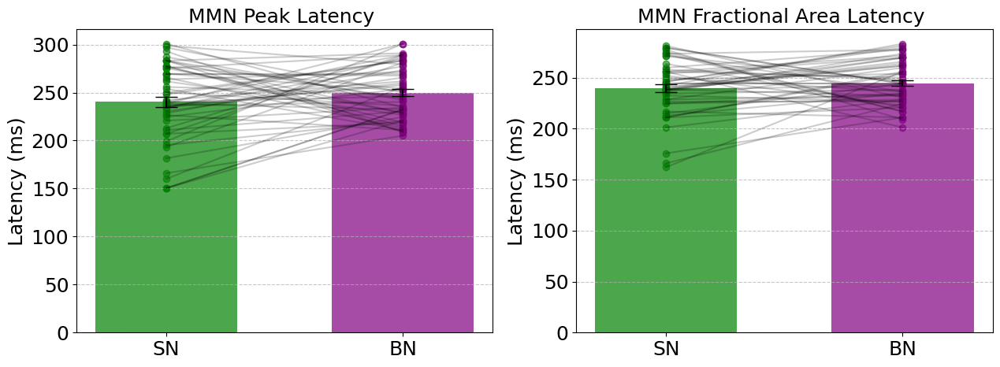

In [ ]:
# Define parameters based on MMN literature
time_window = (150, 300)   # ms - typical MMN window
channels =["Cz"] # Typical frontocentral electrodes for MMN

# 1. Peak latency analysis
peak_lat1, peak_lat2, subjects = extract_mmn_latencies(
    PN_MMN_evokeds_dict ,BN_MMN_evokeds_dict , time_window=time_window, 
    channels=channels, method='peak')
fig, axs = plt.subplots(1, 2, figsize=(15, 5), dpi=100)
peak_results = run_latency_statistical_tests(peak_lat1, peak_lat2)
print("Peak Latency Results:") 
print(f"PN: {peak_results['mean_latency_case1']:.1f} ± {peak_results['std_latency_case1']:.1f} ms")
print(f"BN: {peak_results['mean_latency_case2']:.1f} ± {peak_results['std_latency_case2']:.1f} ms")
print(f"t({peak_results['n_valid']-1}) = {peak_results['t_stat']:.3f}, p = {peak_results['p_value']:.3f}")

# Visualize
peak_fig = visualize_latency_results(peak_lat1, peak_lat2, subjects, "Peak",ax = axs[0],color=["green",'purple'],label=["SN",'BN'])


# 2. Fractional area latency analysis (50%) - more robust to noise
area_lat1, area_lat2, subjects = extract_mmn_latencies(
    PN_MMN_evokeds_dict ,BN_MMN_evokeds_dict, time_window=time_window, 
    channels=channels, method='fractional_area', fractional_area=0.50)

area_results = run_latency_statistical_tests(area_lat1, area_lat2)
print("\nFractional Area Latency Results:")
print(f"SN: {area_results['mean_latency_case1']:.1f} ± {area_results['std_latency_case1']:.1f} ms")
print(f"BN: {area_results['mean_latency_case2']:.1f} ± {area_results['std_latency_case2']:.1f} ms")
print(f"t({area_results['n_valid']-1}) = {area_results['t_stat']:.3f}, p = {area_results['p_value']:.3f}")

# Visualize
area_fig = visualize_latency_results(area_lat1, area_lat2, subjects, "Fractional Area",ax = axs[1],color=["green",'purple'],label=["SN",'BN'])
plt.show()

In [ ]:
sn_peak_lat = np.array([[peak] for peak in peak_lat1])
bn_peak_lat = np.array([[peak] for peak in peak_lat2])
sn_area_lat = np.array([[area] for area in area_lat1])
bn_area_lat = np.array([[area] for area in area_lat2])

SN: 240.4 ± 40.0 ms
BN: 249.9 ± 27.5 ms
t(52) = -1.437, p = 0.157


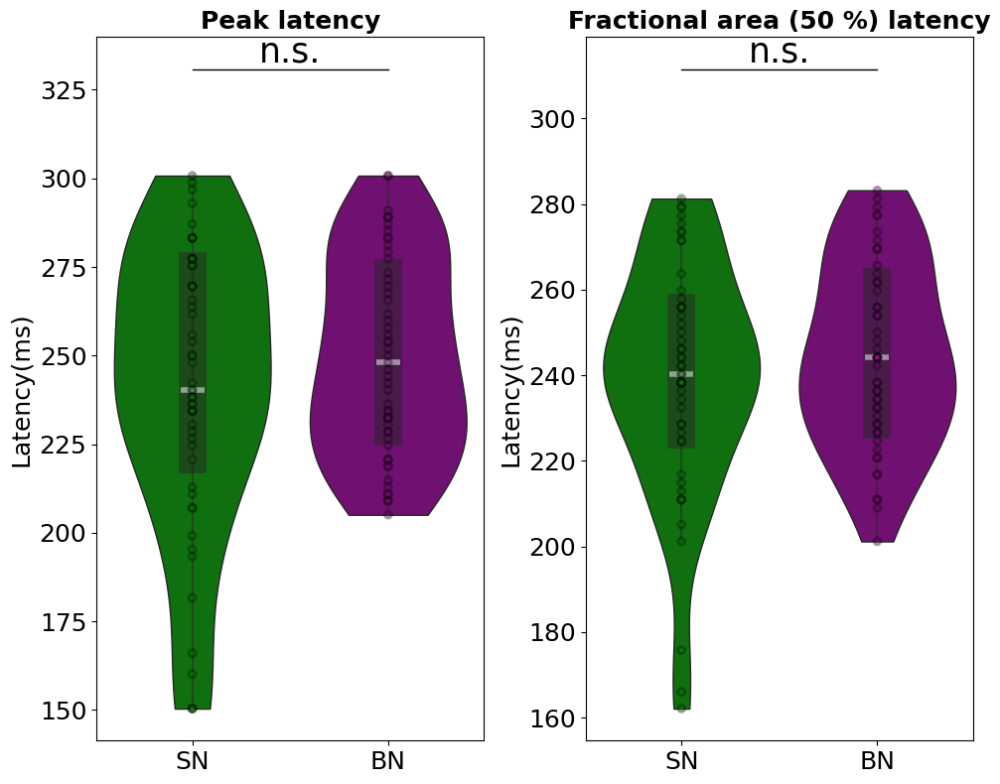

In [ ]:
# Extract Latency
df_type = "Latency"
# Set up the plot
df = df_convert(sn_peak_lat,bn_peak_lat ,label=("SN", "BN"),df_type = df_type)

df[df_type] = df[df_type]
fig, ax = plt.subplots(1,2 , figsize=(10,8), )
sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=["green", "purple"],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[0] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=["green", "purple"], edgecolor='black',dodge=False,ax= ax[0])

y_offset = 1.e-09
y_max = max(df[df_type]) *1.1
p_value = peak_results['p_value']
#print(f't_stat {t_stat } with , p_value { p_value}')
print(f"SN: {peak_results['mean_latency_case1']:.1f} ± {peak_results['std_latency_case1']:.1f} ms")
print(f"BN: {peak_results['mean_latency_case2']:.1f} ± {peak_results['std_latency_case2']:.1f} ms")
print(f"t({peak_results['n_valid']-1}) = {peak_results['t_stat']:.3f}, p = {peak_results['p_value']:.3f}")
ax[0].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax[0].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[0].set_title("Peak latency", fontsize=18, weight='bold')
ax[0].set_xlabel("")
ax[0].set_ylabel(df_type + '(ms)')
#ax.set_xticklabels(["PN", "BN"])


# Fraction area plot 
df = df_convert(sn_area_lat,bn_area_lat ,label=("SN", "BN"),df_type = df_type)

df[df_type] = df[df_type]

sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=["green", "purple"],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[1] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=["green", "purple"], edgecolor='black',dodge=False,ax= ax[1])

y_offset = 1.e-09 
y_max = max(df[df_type]) *1.1
p_value = area_results['p_value']
#print(f't_stat {t_stat } with , p_value { p_value}')
ax[1].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax[1].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[1].set_title(f"Fractional area (50 %) latency", fontsize=18, weight='bold')
ax[1].set_xlabel("")
ax[1].set_ylabel(df_type + '(ms)'  )
#ax.set_xticklabels(["PN", "BN"])
plt.tight_layout()
plt.show()

# Ploting all subjects erp with latency peak

In [ ]:
def plot_subject_erp_with_latency(subject_id, case1_dict, case2_dict, 
                                 time_window=(100, 300), channels=None,
                                 method='peak', fractional_area=0.50,
                                 case1_label='Beep MMN', case2_label='SN MMN',
                                 figsize=(10, 6)):
    """
    Plot ERPs for a single subject with latency markers.
    
    Parameters:
    -----------
    subject_id : str
        Subject identifier (e.g., 'sub-sd011')
    case1_dict, case2_dict : dict
        Dictionaries containing the evoked objects for each condition
    time_window : tuple
        Time window for latency detection (in ms)
    channels : list or None
        Channels to include in analysis
    method : str
        Latency detection method ('peak', 'fractional_area', 'onset')
    fractional_area : float
        Fraction value for fractional area method
    case1_label, case2_label : str
        Labels for the legend
    figsize : tuple
        Figure dimensions
        
    Returns:
    --------
    fig, ax : matplotlib figure and axis objects
    """
    # Get the evoked data
    evoked1 = case1_dict[subject_id].copy()
    evoked2 = case2_dict[subject_id].copy()
    
    # Pick channels if specified
    if channels:
        evoked1 = evoked1.pick_channels(channels)
        evoked2 = evoked2.pick_channels(channels)
    
    # Get full time range data
    times = evoked1.times * 1000  # Convert to ms
    data1 = np.mean(evoked1.data, axis=0) if len(evoked1.data.shape) > 1 else evoked1.data
    data2 = np.mean(evoked2.data, axis=0) if len(evoked2.data.shape) > 1 else evoked2.data
    
    # Create figure
    fig, ax = plt.subplots(figsize=figsize)
    
    # Plot ERPs
    ax.plot(times, data1, color='purple', label=case1_label)
    ax.plot(times, data2, color='green', label=case2_label)
    
    # Calculate latencies for this single subject
    # Create temporary single-subject dictionaries
    temp_case1 = {subject_id: evoked1}
    temp_case2 = {subject_id: evoked2}
    
    # Use your existing function for latency extraction
    case1_lats, case2_lats, subjs = extract_mmn_latencies(
        temp_case1, temp_case2, 
        time_window=time_window, 
        channels=channels,
        method=method, 
        fractional_area=fractional_area
    )
    
    # Mark latencies with vertical lines
    if not np.isnan(case1_lats[0]):
        ax.axvline(x=case1_lats[0], color='purple', linestyle='--', 
                  label=f'{case1_label} latency: {case1_lats[0]:.1f} ms')
    
    if not np.isnan(case2_lats[0]):
        ax.axvline(x=case2_lats[0], color='green', linestyle='--',
                  label=f'{case2_label} latency: {case2_lats[0]:.1f} ms')
    
    # Highlight the analysis time window
    ax.axvspan(time_window[0], time_window[1], alpha=0.1, color='gray', 
              label=f'Analysis window: {time_window[0]}-{time_window[1]} ms')
    
    # Format plot
    ax.set_xlabel('Time (ms)')
    ax.set_ylabel('Amplitude (μV)')
    ax.set_title(f'{subject_id}: {method.capitalize()} Latency')
    ax.grid(True, linestyle=':', alpha=0.6)
    ax.legend(loc='best')
    
    plt.tight_layout()
    return fig, ax


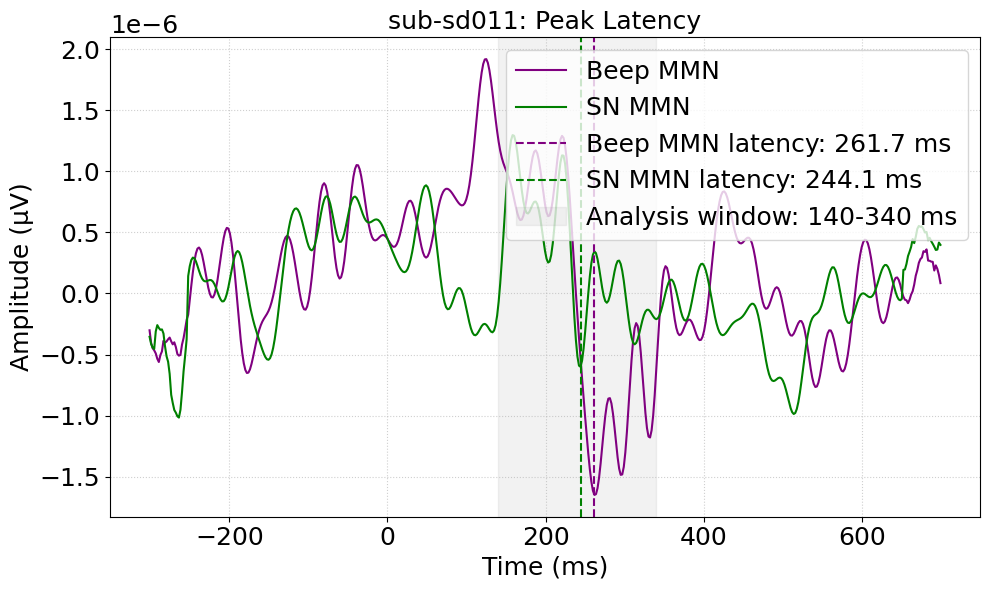

In [ ]:
# Example: Plot single subject ERP with peak latency markers
subj_id = 'sub-sd011'
fig, ax = plot_subject_erp_with_latency(
    subj_id, 
    case1_dict=BN_MMN_evokeds_dict, 
    case2_dict=PN_MMN_evokeds_dict,
    time_window=(140, 340),  # Adjusted based on your shared images
    case1_label='Beep MMN', 
    case2_label='SN MMN',
    method='peak'
)
plt.show()



In [ ]:
def plot_all_subjects_erps_with_latency(case1_dict, case2_dict, 
                                       time_window=(100, 300), channels=None,
                                       method='peak', fractional_area=0.50,
                                       case1_label='Beep MMN', case2_label='SN MMN',
                                       ncols=2, figsize=(15, 12)):
    """
    Plot ERPs with latency markers for all subjects.
    
    Parameters:
    -----------
    case1_dict, case2_dict : dict
        Dictionaries containing the evoked objects for each condition
    time_window : tuple
        Time window for latency detection (in ms)
    channels : list or None
        Channels to include in analysis
    method : str
        Latency detection method ('peak', 'fractional_area', 'onset')
    fractional_area : float
        Fraction value for fractional area method
    case1_label, case2_label : str
        Labels for the legend
    ncols : int
        Number of columns in the subplot grid
    figsize : tuple
        Figure dimensions
        
    Returns:
    --------
    fig : matplotlib figure object
    """
    # Get common subjects
    common_subjects = sorted(set(case1_dict.keys()) & set(case2_dict.keys()))
    
    # Calculate number of rows needed
    nrows = (len(common_subjects) + ncols - 1) // ncols
    
    # Create figure
    fig = plt.figure(figsize=figsize)
    
    # Extract latencies for all subjects at once
    case1_latencies, case2_latencies, subjects = extract_mmn_latencies(
        case1_dict, case2_dict, 
        time_window=time_window, 
        channels=channels,
        method=method, 
        fractional_area=fractional_area
    )
    
    # Create a plot for each subject
    for i, subject_id in enumerate(subjects):
        ax = fig.add_subplot(nrows, ncols, i+1)
        
        # Get the evoked data
        evoked1 = case1_dict[subject_id].copy()
        evoked2 = case2_dict[subject_id].copy()
        
        # Pick channels if specified
        if channels:
            evoked1 = evoked1.pick_channels(channels)
            evoked2 = evoked2.pick_channels(channels)
        
        # Get the data and time axis
        times = evoked1.times * 1000  # Convert to ms
        data1 = np.mean(evoked1.data, axis=0) if len(evoked1.data.shape) > 1 else evoked1.data
        data2 = np.mean(evoked2.data, axis=0) if len(evoked2.data.shape) > 1 else evoked2.data
        
        # Plot ERPs
        ax.plot(times, data1, color='purple', label=case1_label)
        ax.plot(times, data2, color='green', label=case2_label)
        
        # Mark latencies with vertical lines
        if not np.isnan(case1_latencies[i]):
            ax.axvline(x=case1_latencies[i], color='purple', linestyle='--')
        
        if not np.isnan(case2_latencies[i]):
            ax.axvline(x=case2_latencies[i], color='green', linestyle='--')
        
        # Highlight the analysis time window
        ax.axvspan(time_window[0], time_window[1], alpha=0.1, color='gray')
        
        # Format plot
        ax.set_xlabel('Time (ms)')
        ax.set_ylabel('μV')
        ax.set_title(f'{subject_id}', fontsize=10, pad=2)
        ax.grid(True, linestyle=':', alpha=0.5)
        
        # Add legend to first subplot only to avoid clutter
        if i == 0:
            ax.legend(loc='best')
    
    plt.tight_layout()
    fig.suptitle(f'{method.capitalize()} Latency Detection {time_window} ms', fontsize=16)
    plt.subplots_adjust(top=.96)
    
    return fig


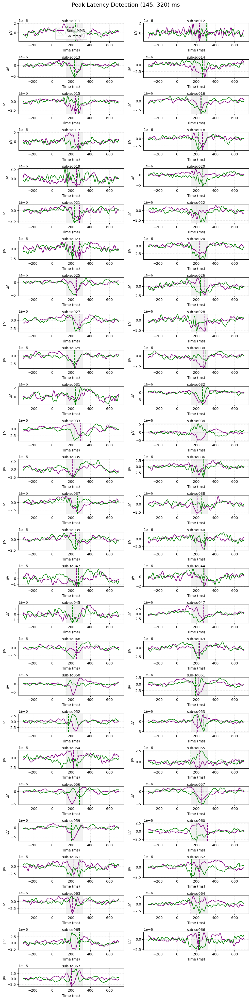

In [ ]:
# Plot all subjects in a grid
plt.rcParams.update({
        'xtick.labelsize': 10,
        'ytick.labelsize': 10,
        'axes.labelsize': 10,
        'axes.titlesize': 10,
        'legend.fontsize': 10,
    })
fig = plot_all_subjects_erps_with_latency(
    case1_dict=BN_MMN_evokeds_dict, 
    case2_dict=PN_MMN_evokeds_dict,
    time_window=(145, 320),  # Adjusted based on your shared images where MMN is visible
    method='peak',
    case1_label='Beep MMN', 
    case2_label='SN MMN',
    ncols=2,
    figsize=(10, 40)
)

plt.show()


Statistical test results:
overall: t=-0.719, p=0.475
channel_Fz: t=-0.305, p=0.762
channel_Cz: t=-1.030, p=0.308
channel_Pz: t=-0.778, p=0.440
Statistical test results:
overall: t=-0.529, p=0.599
channel_Fz: t=-0.445, p=0.658
channel_Cz: t=-0.860, p=0.394
channel_Pz: t=-0.109, p=0.914


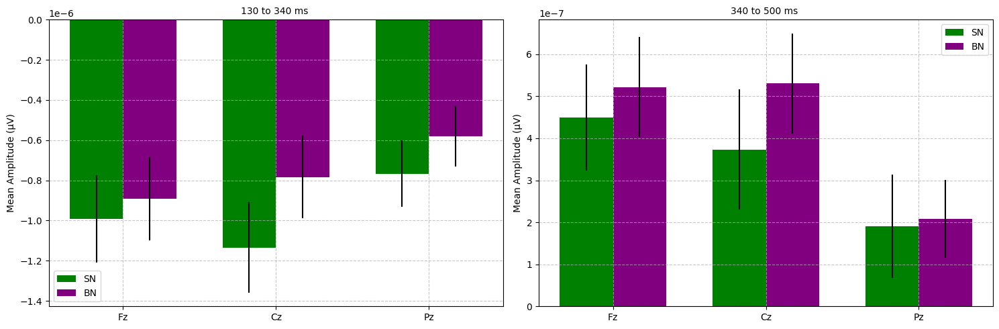

In [ ]:
time_window = (130, 340)  # MMN typically 100-250ms
channels = [ 'Fz','Cz','Pz']  # Common MMN channels

# Extract amplitudes
PN_amps, BN_amps, subjects = extract_mmn_amplitudes(
    PN_MMN_evokeds_dict ,BN_MMN_evokeds_dict , time_window=time_window, channels=channels
)

# Run statistical tests
results = run_statistical_tests(PN_amps, BN_amps,channels= channels)
print("Statistical test results:")
for key, data in results.items():
    print(f"{key}: t={data['t_stat']:.3f}, p={data['p_value']:.3f}")

# Visualize
fig, axs = plt.subplots(1, 2, figsize=(15, 5), dpi=100)
fig = visualize_results(PN_amps, BN_amps, subjects, channel_names=channels,label= ("SN",'BN'),color=("green",'purple'),ax = axs[0],title= '130 to 340 ms ')

PN_amps, BN_amps, subjects = extract_mmn_amplitudes(
    PN_MMN_evokeds_dict ,BN_MMN_evokeds_dict , time_window=(340,500), channels=channels
)

# Run statistical tests
results = run_statistical_tests(PN_amps, BN_amps,channels= channels)
print("Statistical test results:")
for key, data in results.items():
    print(f"{key}: t={data['t_stat']:.3f}, p={data['p_value']:.3f}")
fig = visualize_results(PN_amps, BN_amps, subjects, channel_names=channels,label= ("SN",'BN'),color=("green",'purple'),ax = axs[1],title= '340 to 500 ms ')
plt.tight_layout()
plt.show()


# Epoch shift and analysis 

### Find the time at which the it crosses 95 % thresold 

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mne.epochs import EpochsArray

def find_amplitude_threshold_timepoint(evoked, percentile=95, time_window=(100, 500), 
                                      polarity='negative'):
    """
    Find the time point where signal amplitude crosses a percentile threshold.
    
    Parameters:
    -----------
    evoked : mne.Evoked
        Evoked object containing ERP data
    percentile : float
        Percentile threshold (e.g., 95 means find where amplitude exceeds 95% of max)
    time_window : tuple
        Time window in milliseconds to search for the threshold crossing
    polarity : str
        'negative' for MMN-like responses, 'positive' for positive ERPs
        
    Returns:
    --------
    threshold_time : float
        Time point (in seconds) where the threshold is crossed
    amplitude_at_threshold : float
        Amplitude value at the threshold crossing point
    """
    # Convert milliseconds to seconds for time window
    tmin, tmax = time_window[0]/1000, time_window[1]/1000
    
    # Crop to time window of interest
    data = evoked.copy().crop(tmin=tmin, tmax=tmax)
    times = data.times
    
    # Get the signal (mean across channels if multiple)
    signal = data.data.mean(axis=0) if len(data.data.shape) > 1 else data.data
    
    # For negative polarity like MMN, invert the signal for threshold calculation
    if polarity == 'negative':
        working_signal = -signal  # Invert so peaks are positive
    else:
        working_signal = signal
    
    # Calculate the percentile threshold of amplitude
    threshold_value = np.percentile(working_signal, percentile)
    
    # Find the first time point where amplitude exceeds the threshold
    try:
        threshold_idx = np.where(working_signal >= threshold_value)[0][0]
        threshold_time = times[threshold_idx]
        amplitude_at_threshold = signal[threshold_idx]  # Use original signal for return value
    except IndexError:
        # No point exceeds threshold
        threshold_time = None
        amplitude_at_threshold = None
    
    return threshold_time, amplitude_at_threshold


In [ ]:
def process_all_subjects(beep_mmn_dict, sn_mmn_dict, percentile=95, 
                         time_window=(100, 500), polarity='negative'):
    """
    Process all subjects to find threshold timepoints for both conditions.
    
    Parameters:
    -----------
    beep_mmn_dict, sn_mmn_dict : dict
        Dictionaries with subject IDs as keys and evoked objects as values
    percentile : float
        Percentile threshold for amplitude
    time_window : tuple
        Time window in milliseconds to search for the threshold
    polarity : str
        'negative' for MMN-like responses, 'positive' for positive ERPs
        
    Returns:
    --------
    dict
        Dictionary with subject IDs as keys and tuple of results for each condition
    """
    results = {}
    common_subjects = sorted(set(beep_mmn_dict.keys()) & set(sn_mmn_dict.keys()))
    
    for subject_id in common_subjects:
        beep_time, beep_amp = find_amplitude_threshold_timepoint(
            beep_mmn_dict[subject_id], 
            percentile=percentile, 
            time_window=time_window, 
            polarity=polarity
        )
        
        sn_time, sn_amp = find_amplitude_threshold_timepoint(
            sn_mmn_dict[subject_id], 
            percentile=percentile, 
            time_window=time_window, 
            polarity=polarity
        )
        
        results[subject_id] = {
            'beep': {'time': beep_time, 'amplitude': beep_amp},
            'sn': {'time': sn_time, 'amplitude': sn_amp}
        }
    
    return results


In [ ]:
def visualize_threshold_points(subject_id, beep_mmn_dict, sn_mmn_dict, 
                              threshold_results, time_range=None):
    """
    Visualize the ERPs with marked threshold points.
    
    Parameters:
    -----------
    subject_id : str
        Subject ID to visualize
    beep_mmn_dict, sn_mmn_dict : dict
        Dictionaries with evoked objects
    threshold_results : dict
        Results from process_all_subjects
    time_range : tuple or None
        Optional time range (min, max) in seconds to display
    """
    # Get the evoked data
    beep_evoked = beep_mmn_dict[subject_id].copy()
    sn_evoked = sn_mmn_dict[subject_id].copy()
    
    # Get the threshold times
    beep_time = threshold_results[subject_id]['beep']['time']
    sn_time = threshold_results[subject_id]['sn']['time']
    
    # Create figure
    fig, ax = plt.subplots(figsize=(10, 6))
    
    # Apply time range if specified
    if time_range:
        beep_evoked = beep_evoked.copy().crop(*time_range)
        sn_evoked = sn_evoked.copy().crop(*time_range)
    
    # Get times and data
    times = beep_evoked.times * 1000  # Convert to ms
    beep_data = np.mean(beep_evoked.data, axis=0) if len(beep_evoked.data.shape) > 1 else beep_evoked.data
    sn_data = np.mean(sn_evoked.data, axis=0) if len(sn_evoked.data.shape) > 1 else sn_evoked.data
    
    # Plot ERPs
    ax.plot(times, beep_data, 'purple', label='Beep MMN')
    ax.plot(times, sn_data, 'green', label='SN MMN')
    
    # Mark threshold points
    if beep_time is not None:
        beep_time_ms = beep_time * 1000  # Convert to ms
        ax.axvline(x=beep_time_ms, color='purple', linestyle='--',
                  label=f'Beep 95% threshold: {beep_time_ms:.1f} ms')
    
    if sn_time is not None:
        sn_time_ms = sn_time * 1000  # Convert to ms
        ax.axvline(x=sn_time_ms, color='green', linestyle='--',
                  label=f'SN 95% threshold: {sn_time_ms:.1f} ms')
    
    # Format plot
    ax.set_xlabel('Time (ms)')
    ax.set_ylabel('Amplitude (μV)')
    ax.set_title(f'{subject_id}: 95% Amplitude Threshold')
    ax.grid(True, linestyle=':', alpha=0.6)
    ax.legend(loc='best')
    
    plt.tight_layout()
    return fig, ax


C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_8968\3908102471.py:30: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evoked.EvokedArray'>.tmax (0.699219 s)
  beep_evoked = beep_evoked.copy().crop(*time_range)
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_8968\3908102471.py:31: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evoked.EvokedArray'>.tmax (0.699219 s)
  sn_evoked = sn_evoked.copy().crop(*time_range)


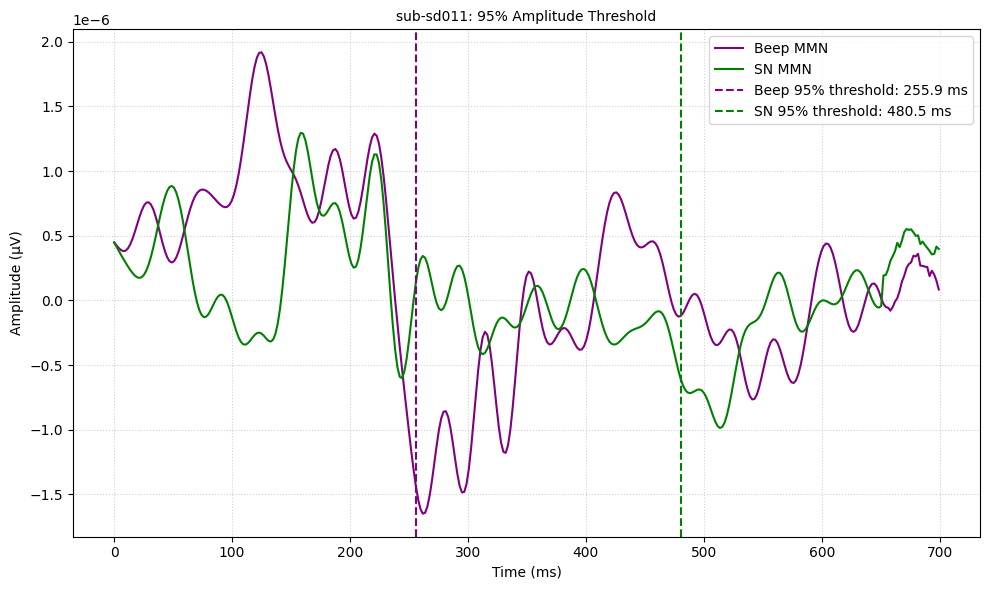

C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_8968\3908102471.py:30: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evoked.EvokedArray'>.tmax (0.699219 s)
  beep_evoked = beep_evoked.copy().crop(*time_range)
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_8968\3908102471.py:31: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evoked.EvokedArray'>.tmax (0.699219 s)
  sn_evoked = sn_evoked.copy().crop(*time_range)


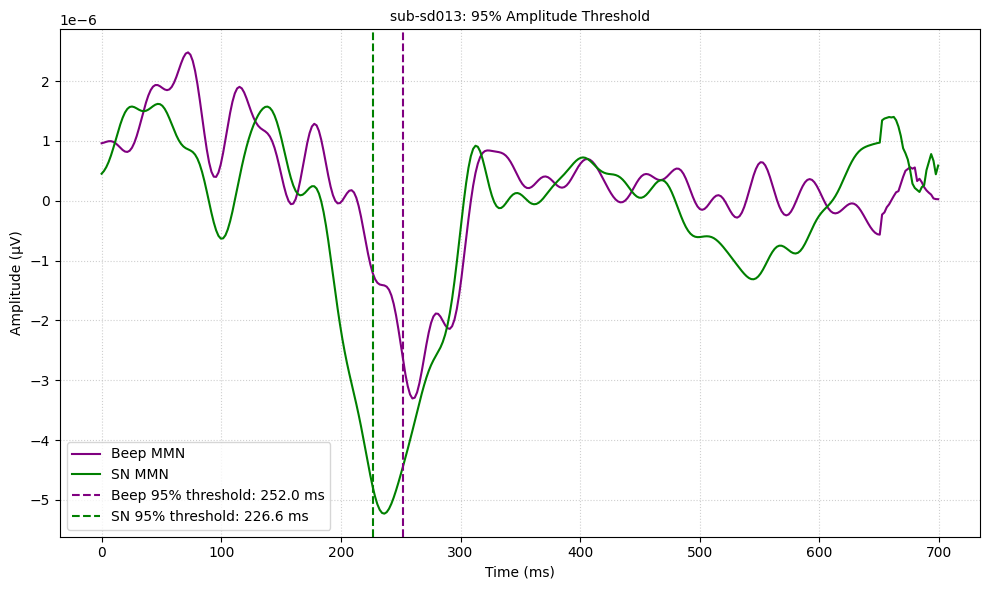

In [ ]:
# Example usage
# First, process all subjects to find threshold timepoints
time_window=(100, 500)
threshold_results = process_all_subjects(
    BN_MMN_evokeds_dict, 
    PN_MMN_evokeds_dict,
    percentile=95,  
    time_window=time_window,  # Based on your ERP images
    polarity='negative'
)

# Visualize results for specific subjects
for subject_id in ['sub-sd011', 'sub-sd013']:
    fig, ax = visualize_threshold_points(
        subject_id,
        BN_MMN_evokeds_dict,
        PN_MMN_evokeds_dict,
        threshold_results,
        time_range=(0.0, 0.7)  # 0-700 ms
    )
    plt.show()

# Create epochs around these threshold points
# NOTE: This requires raw data for each subject
# epochs_dict = create_epochs_around_threshold(raw_data, threshold_results)


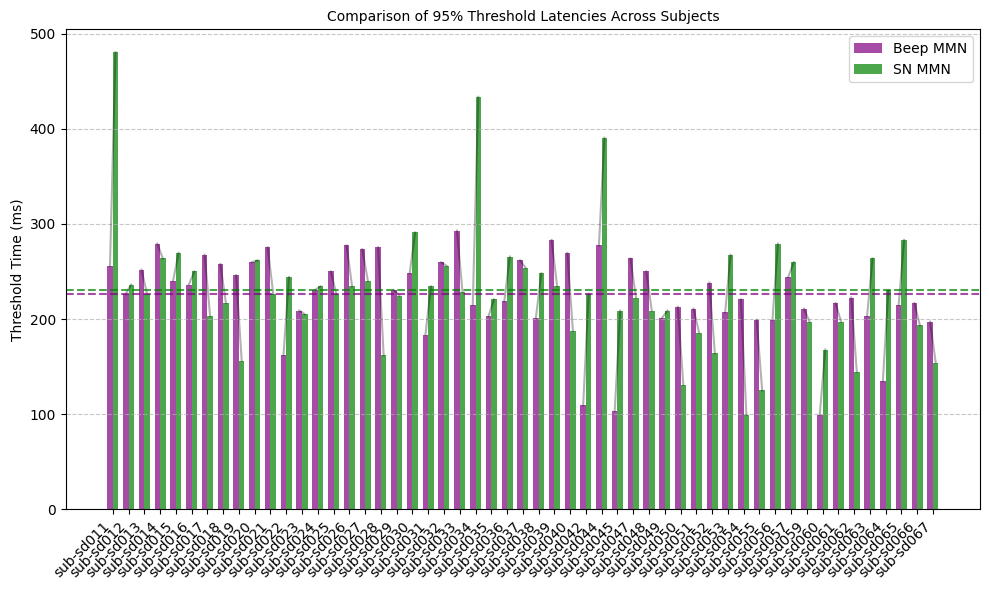

In [ ]:
def plot_threshold_comparison(threshold_results, figsize=(10, 6)):
    """
    Create a summary plot comparing threshold times across subjects.
    
    Parameters:
    -----------
    threshold_results : dict
        Results from process_all_subjects function
    figsize : tuple
        Figure dimensions
    
    Returns:
    --------
    fig : matplotlib figure
    """
    subjects = []
    beep_times = []
    sn_times = []
    
    for subject_id, data in threshold_results.items():
        beep_time = data['beep']['time']
        sn_time = data['sn']['time']
        
        if beep_time is not None and sn_time is not None:
            subjects.append(subject_id)
            beep_times.append(beep_time * 1000)  # Convert to ms
            sn_times.append(sn_time * 1000)      # Convert to ms
    
    fig, ax = plt.subplots(figsize=figsize)
    
    # Plot paired points for each subject
    x = np.arange(len(subjects))
    width = 0.35
    
    ax.bar(x - width/2, beep_times, width, label='Beep MMN', color='purple', alpha=0.7)
    ax.bar(x + width/2, sn_times, width, label='SN MMN', color='green', alpha=0.7)
    
    # Connect paired points
    for i in range(len(subjects)):
        ax.plot([i - width/2, i + width/2], [beep_times[i], sn_times[i]], 'k-', alpha=0.3)
    
    # Add labels and formatting
    ax.set_ylabel('Threshold Time (ms)')
    ax.set_title('Comparison of 95% Threshold Latencies Across Subjects')
    ax.set_xticks(x)
    ax.set_xticklabels(subjects, rotation=45, ha='right')
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.7, axis='y')
    
    # Calculate average for each condition
    avg_beep = np.mean(beep_times)
    avg_sn = np.mean(sn_times)
    
    # Add horizontal lines for averages
    ax.axhline(y=avg_beep, color='purple', linestyle='--', alpha=0.7, 
              label=f'Avg Beep: {avg_beep:.1f} ms')
    ax.axhline(y=avg_sn, color='green', linestyle='--', alpha=0.7,
              label=f'Avg SN: {avg_sn:.1f} ms')
    
    plt.tight_layout()
    return fig

plot_threshold_comparison(threshold_results, figsize=(10, 6))
plt.show()

C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_8968\2251770818.py:53: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evoked.EvokedArray'>.tmax (0.699219 s)
  beep_evoked = beep_evoked.copy().crop(tmin=tmin, tmax=tmax)
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_8968\2251770818.py:54: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evoked.EvokedArray'>.tmax (0.699219 s)
  sn_evoked = sn_evoked.copy().crop(tmin=tmin, tmax=tmax)
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_8968\2251770818.py:53: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evoked.EvokedArray'>.tmax (0.699219 s)
  beep_evoked = beep_evoked.copy().crop(tmin=tmin, tmax=tmax)
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_8968\2251770818.py:54: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evoked.EvokedArray'>.tmax (0.699219 s)
  sn_evoked = sn_evoked.copy().crop(tmin=tmin, tmax=tmax)
C:\Users\PRAKASH\AppData\Local\Temp\

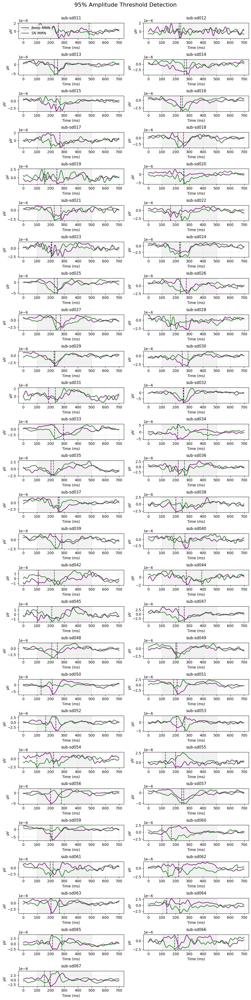

In [ ]:
def plot_all_subjects_threshold_points(beep_mmn_dict, sn_mmn_dict, 
                                     threshold_results, percentile=95,
                                     time_window=(200, 500),
                                     time_range=(0, 700),
                                     ncols=2, figsize=(16, 12)):
    """
    Plot ERPs with threshold points for all subjects in a grid.
    
    Parameters:
    -----------
    beep_mmn_dict, sn_mmn_dict : dict
        Dictionaries with subject IDs as keys and evoked objects as values
    threshold_results : dict
        Results from process_all_subjects function
    percentile : int
        Percentile threshold used (for title and legend)
    time_window : tuple
        Time window in ms used for threshold detection
    time_range : tuple
        Time range in ms to display in the plots
    ncols : int
        Number of columns in the grid
    figsize : tuple
        Figure size
        
    Returns:
    --------
    fig : matplotlib figure object
    """
    # Get common subjects
    common_subjects = sorted(set(beep_mmn_dict.keys()) & set(sn_mmn_dict.keys()))
    
    # Calculate rows needed based on number of subjects and columns
    nrows = (len(common_subjects) + ncols - 1) // ncols
    
    # Create figure with extra spacing
    fig, axes = plt.subplots(nrows, ncols, figsize=figsize)
    if nrows == 1 and ncols == 1:
        axes = np.array([axes])
    axes = axes.flatten() if hasattr(axes, 'flatten') else [axes]
    
    # For each subject
    for i, subject_id in enumerate(common_subjects):
        if i < len(axes): 
            ax = axes[i]
            
            # Get the evoked data for this subject
            beep_evoked = beep_mmn_dict[subject_id].copy()
            sn_evoked = sn_mmn_dict[subject_id].copy()
            
            # Convert time range to seconds for cropping
            tmin, tmax = time_range[0]/1000, time_range[1]/1000
            beep_evoked = beep_evoked.copy().crop(tmin=tmin, tmax=tmax)
            sn_evoked = sn_evoked.copy().crop(tmin=tmin, tmax=tmax)
            
            # Get times and data
            times = beep_evoked.times * 1000  # Convert to ms
            beep_data = np.mean(beep_evoked.data, axis=0) if len(beep_evoked.data.shape) > 1 else beep_evoked.data
            sn_data = np.mean(sn_evoked.data, axis=0) if len(sn_evoked.data.shape) > 1 else sn_evoked.data
            
            # Plot ERPs
            ax.plot(times, beep_data, 'purple', label='Beep MMN')
            ax.plot(times, sn_data, 'green', label='SN MMN')
            
            # Get threshold times for this subject if available
            if subject_id in threshold_results:
                # Mark threshold points with vertical lines
                beep_time = threshold_results[subject_id]['beep']['time']
                sn_time = threshold_results[subject_id]['sn']['time']
                
                if beep_time is not None:
                    beep_time_ms = beep_time * 1000  # Convert to ms
                    ax.axvline(x=beep_time_ms, color='purple', linestyle='--')
                
                if sn_time is not None:
                    sn_time_ms = sn_time * 1000  # Convert to ms
                    ax.axvline(x=sn_time_ms, color='green', linestyle='--')
            
            # Highlight the analysis time window
            ax.axvspan(time_window[0], time_window[1], alpha=0.1, color='gray')
            
            # Format plot
            ax.set_xlabel('Time (ms)')
            ax.set_ylabel('μV')
            ax.set_title(f'{subject_id}', pad=10, fontsize=11)
            ax.grid(True, linestyle=':', alpha=0.5)
            
            # Add legend to first subplot only
            if i == 0:
                ax.legend(loc='best')
    
    # Hide any unused subplots
    for j in range(len(common_subjects), len(axes)):
        axes[j].set_visible(False)
    
    # Add overall title
    fig.suptitle(f'{percentile}% Amplitude Threshold Detection', fontsize=16, y=0.98)
    
    # Apply improved spacing to avoid title overlap
    plt.tight_layout()
    plt.subplots_adjust(top=0.96)
    
    return fig

# Plot all subjects in a grid
plt.rcParams.update({
        'xtick.labelsize': 10,
        'ytick.labelsize': 10,
        'axes.labelsize': 10,
        'axes.titlesize': 10,
        'legend.fontsize': 10,
    })
# Then create the multi-subject plot
fig = plot_all_subjects_threshold_points(
    BN_MMN_evokeds_dict,
    PN_MMN_evokeds_dict,
    threshold_results,
    percentile=95,
    time_window=time_window,
    time_range=(0, 700),
    ncols=2,
    figsize=(10, 40)
)

plt.show()


### Aligning the thresold at zero point and Grand ERP

In [ ]:
from mne import EvokedArray
def align_and_standardize_evokeds(evoked_dict, threshold_results, condition_key):
    """
    Align evoked responses to threshold points and standardize time ranges.
    
    Parameters:
    -----------
    evoked_dict : dict
        Dictionary with subject IDs as keys and evoked objects as values
    threshold_results : dict
        Pre-calculated results from process_all_subjects
    condition_key : str
        Key to access condition-specific threshold times ('beep' or 'sn')
    tmin, tmax : float
        Standardized time range in seconds, relative to threshold point
        
    Returns:
    --------
    dict
        Dictionary with subject IDs as keys and standardized evoked objects
    """
    aligned_dict = {}
    
    # Use only subjects that exist in both dictionaries and have valid thresholds
    common_subjects = set(evoked_dict.keys()) & set(threshold_results.keys())
    
    valid_subjects = []
    
    for subject_id in common_subjects:
        # Get the pre-calculated threshold time
        threshold_time = threshold_results[subject_id][condition_key]['time']
        
        if threshold_time is not None:
            # Make a copy to avoid modifying the original
            evoked_copy = evoked_dict[subject_id].copy()
            
            # Shift time to center at the threshold point
            evoked_copy.shift_time(-threshold_time)
            
            
            # Store the aligned and cropped evoked object
            aligned_dict[subject_id] = evoked_copy
            valid_subjects.append(subject_id)
    
    print(f"Successfully aligned {len(valid_subjects)} subjects: {valid_subjects}")
    return aligned_dict


def update_evoked_times(aligned_dict, atol: float = 1e-8):
    """
    Return a new list of EvokedArray objects where:
      - The time point closest to zero is set to 0.0,
      - Time points after it are recomputed using sampling rate,
      - Time points before it are unchanged.
    
    Parameters
    ----------
    evokeds : list of mne.Evoked
        List of Evoked objects to update.
    atol : float
        Tolerance to consider a time point effectively zero.

    Returns
    -------
    updated_evokeds : list of mne.EvokedArray
        List of EvokedArray objects with updated timing.
    """
    evoked_list = list(aligned_dict.values())
    updated_evokeds = []
    
    for evoked in evoked_list:
        times = evoked.times
        sfreq = evoked.info['sfreq']
        dt = 1.0 / sfreq

        zero_idx = np.argmin(np.abs(times))
        if not np.isclose(times[zero_idx], 0.0, atol=atol):
            print(f"Warning: Closest to zero is {times[zero_idx]:.6f}, not within atol={atol}")

        # Calculate new tmin such that time at zero_idx becomes 0
        new_tmin = -zero_idx * dt

        # Create new evoked with same data, info, and updated tmin
        new_evoked = EvokedArray(evoked.data, evoked.info, tmin=new_tmin, nave=evoked.nave,
                                 comment=evoked.comment, kind=evoked.kind)
        updated_evokeds.append(new_evoked)

    return updated_evokeds


Successfully aligned 53 subjects: ['sub-sd065', 'sub-sd027', 'sub-sd013', 'sub-sd054', 'sub-sd067', 'sub-sd052', 'sub-sd029', 'sub-sd038', 'sub-sd033', 'sub-sd025', 'sub-sd014', 'sub-sd012', 'sub-sd020', 'sub-sd064', 'sub-sd049', 'sub-sd019', 'sub-sd032', 'sub-sd035', 'sub-sd037', 'sub-sd040', 'sub-sd042', 'sub-sd016', 'sub-sd061', 'sub-sd053', 'sub-sd044', 'sub-sd028', 'sub-sd024', 'sub-sd026', 'sub-sd031', 'sub-sd051', 'sub-sd066', 'sub-sd055', 'sub-sd030', 'sub-sd034', 'sub-sd059', 'sub-sd017', 'sub-sd039', 'sub-sd050', 'sub-sd062', 'sub-sd022', 'sub-sd048', 'sub-sd018', 'sub-sd036', 'sub-sd060', 'sub-sd056', 'sub-sd047', 'sub-sd011', 'sub-sd057', 'sub-sd015', 'sub-sd023', 'sub-sd045', 'sub-sd021', 'sub-sd063']
Successfully aligned 53 subjects: ['sub-sd065', 'sub-sd027', 'sub-sd013', 'sub-sd054', 'sub-sd067', 'sub-sd052', 'sub-sd029', 'sub-sd038', 'sub-sd033', 'sub-sd025', 'sub-sd014', 'sub-sd012', 'sub-sd020', 'sub-sd064', 'sub-sd049', 'sub-sd019', 'sub-sd032', 'sub-sd035', 'sub-sd

C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_8968\3481413961.py:34: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(


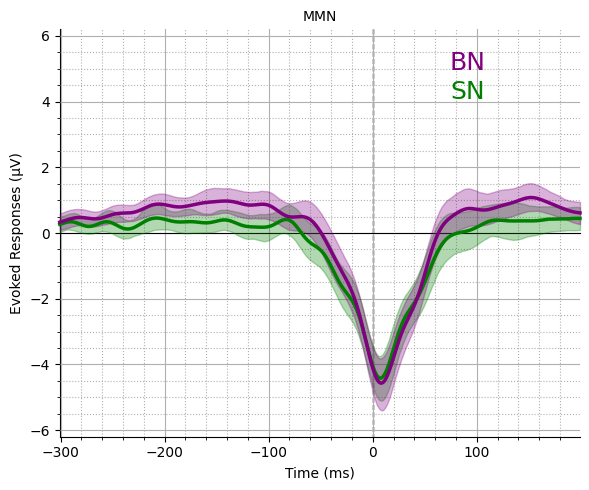

In [ ]:

# Step 1: Align evoked data to threshold times
beep_aligned = align_and_standardize_evokeds(
    BN_MMN_evokeds_dict, 
    threshold_results, 
    condition_key='beep'
)

sn_aligned = align_and_standardize_evokeds(
    PN_MMN_evokeds_dict, 
    threshold_results, 
    condition_key='sn'
)

# Step 2: Create grand averages with common time window
beep_grand_avg = update_evoked_times(beep_aligned)
sn_grand_avg = update_evoked_times(sn_aligned)

# Step 3: Visualize the results
# Define BN vs PN ERPs comparison
MMN_evokeds = {
           'PN': sn_grand_avg ,
           'BN':beep_grand_avg ,
                      }
stylesdict ={"BN": {"linewidth": 2.5,"linestyle":'solid','color': 'purple'},
             'PN': {"linewidth": 2.5,"linestyle":'solid','color': 'green'},
             }
text_labels = [
    (0.90, "BN",'purple'),
    (0.83, f"SN",'green'),
] 
plot_erps(MMN_evokeds, picks=[ 'Cz'],
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,title="MMN",time_range=(-.300,.200))
plt.tight_layout()
plt.show()

# Common Spatial Pattern (CSP)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mne.decoding import CSP
import mne
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.pipeline import make_pipeline
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis


def apply_csp_to_evoked_data(beep_mmn_dict, sn_mmn_dict, time_window=(0.150, 0.350),
                            n_components=4, n_splits=5):
    """
    Apply Common Spatial Patterns to analyze MMN evoked responses.
    
    Parameters:
    -----------
    beep_mmn_dict : dict
        Dictionary with subject IDs as keys and evoked objects for Beep MMN
    sn_mmn_dict : dict
        Dictionary with subject IDs as keys and evoked objects for SN MMN
    time_window : tuple
        Time window in seconds to focus analysis on (typically when MMN is present)
    n_components : int
        Number of CSP components to extract
    n_splits : int
        Number of cross-validation splits for performance evaluation
        
    Returns:
    --------
    dict
        Dictionary containing CSP patterns, filters, selected electrodes, and scores
    """
    # Get common subjects between conditions
    common_subjects = sorted(set(beep_mmn_dict.keys()) & set(sn_mmn_dict.keys()))
    
    if not common_subjects:
        raise ValueError("No common subjects found between the two conditions")
    
    print(f"Processing {len(common_subjects)} subjects")
    
    # Convert evoked data to a format suitable for CSP
    # We'll extract data from the specified time window
    X = []  # Will hold all data
    y = []  # Will hold corresponding labels
    
    # First, determine common channels across all subjects
    all_channels = set(beep_mmn_dict[common_subjects[0]].ch_names)
    for subject in common_subjects:
        all_channels &= set(beep_mmn_dict[subject].ch_names)
        all_channels &= set(sn_mmn_dict[subject].ch_names)
    
    common_channels = sorted(list(all_channels))
    print(f"Found {len(common_channels)} common channels across all subjects")
    
    for subject in common_subjects:
        # Extract data from beep MMN condition
        beep_evoked = beep_mmn_dict[subject].copy()
        beep_evoked.pick_channels(common_channels)
        beep_data = beep_evoked.crop(tmin=time_window[0], tmax=time_window[1]).data
        
        # Extract data from SN MMN condition
        sn_evoked = sn_mmn_dict[subject].copy()
        sn_evoked.pick_channels(common_channels)
        sn_data = sn_evoked.crop(tmin=time_window[0], tmax=time_window[1]).data
        
        # Add to our dataset
        # We treat each subject's evoked response as a "single trial" for CSP
        X.append(beep_data)
        X.append(sn_data)
        y.extend([0, 1])  # 0 for beep, 1 for SN
    
    # Convert to numpy array with shape (n_samples, n_channels, n_times)
    X = np.array(X)
    y = np.array(y)
    
    # Initialize CSP
    csp = CSP(n_components=n_components, reg=None, log=True, norm_trace=False)
    
    # Apply CSP to get spatial filters
    csp.fit(X, y)
    
    # Get patterns and filters
    patterns = csp.patterns_
    filters = csp.filters_
    
    # Create pipeline for classification
    clf = make_pipeline(CSP(n_components=n_components, reg=None, log=True), 
                       LinearDiscriminantAnalysis())
    
    # Perform cross-validation
    cv = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
    scores = cross_val_score(clf, X, y, cv=cv)
    
    # Rank electrodes based on their contribution to the patterns
    electrode_importance = rank_electrodes_by_csp_patterns(patterns, common_channels)
    
    # Store results
    results = {
        'patterns': patterns,
        'filters': filters,
        'common_channels': common_channels,
        'electrode_importance': electrode_importance,
        'classification_scores': scores,
        'mean_score': np.mean(scores),
        'std_score': np.std(scores),
    }
    
    return results


def rank_electrodes_by_csp_patterns(patterns, channel_names):
    """
    Rank electrodes by their importance in CSP patterns.
    
    Parameters:
    -----------
    patterns : ndarray
        CSP patterns matrix (channels x components)
    channel_names : list
        Names of channels corresponding to patterns rows
        
    Returns:
    --------
    dict
        Dictionary of channels sorted by importance
    """
    # Calculate importance for each electrode across all patterns
    importance = np.sum(np.abs(patterns), axis=1)
    
    # Create dictionary of channel importances
    channel_importance = {ch: imp for ch, imp in zip(channel_names, importance)}
    
    # Sort by importance (descending)
    sorted_channels = sorted(channel_importance.items(), key=lambda x: x[1], reverse=True)
    
    return sorted_channels


def select_top_electrodes(electrode_importance, n_electrodes=10):
    """
    Select top N electrodes based on importance ranking.
    
    Parameters:
    -----------
    electrode_importance : list of tuples
        List of (channel, importance) tuples, sorted by importance
    n_electrodes : int
        Number of electrodes to select
        
    Returns:
    --------
    list
        Names of the top N electrodes
    """
    return [ch for ch, _ in electrode_importance[:n_electrodes]]


def visualize_csp_patterns(patterns, channel_names, info, n_components=4):
    """
    Visualize CSP patterns as topographic maps.
    
    Parameters:
    -----------
    patterns : ndarray
        CSP patterns matrix
    channel_names : list
        Names of channels corresponding to patterns rows
    info : mne.Info
        Info object containing channel positions
    n_components : int
        Number of components to visualize
    """
    # Create a copy of the info structure with only the channels we used
    info_pick = mne.pick_info(info, [info['ch_names'].index(ch) for ch in channel_names])
    
    # Create evoked object for visualization
    # (this is a trick to use MNE's plotting functions)
    times = np.arange(n_components)
    patterns_data = patterns[:, :n_components]
    
    # Create an evoked object
    evoked = mne.EvokedArray(patterns_data, info_pick, tmin=0)
    
    # Plot topomaps
    fig = evoked.plot_topomap(times=times, show=False,
                             time_format='Component %01d')
    
    return fig


def apply_csp_filters_to_evoked(evoked, filters, channel_names):
    """
    Apply CSP spatial filters to an evoked object.
    
    Parameters:
    -----------
    evoked : mne.Evoked
        Evoked object to filter
    filters : ndarray
        CSP spatial filters
    channel_names : list
        Names of channels corresponding to filter columns
        
    Returns:
    --------
    mne.Evoked
        Filtered evoked object
    """
    evoked_copy = evoked.copy()
    
    # Pick the channels that match our CSP filters
    evoked_copy.pick_channels(channel_names)
    
    # Apply the spatial filters
    filtered_data = np.dot(filters.T, evoked_copy.data)
    
    # Create a new evoked object with the filtered data
    # First, create a simple info object for the CSP components
    n_components = filters.shape[1]
    info = mne.create_info(
        ch_names=[f'CSP{i}' for i in range(n_components)],
        sfreq=evoked.info['sfreq'],
        ch_types=['misc'] * n_components
    )
    
    # Create evoked with filtered data
    filtered_evoked = mne.EvokedArray(filtered_data, info, 
                                     tmin=evoked.times[0],
                                     comment=evoked.comment)
    
    return filtered_evoked


def create_evoked_with_selected_electrodes(evoked, selected_channels):
    """
    Create new evoked object with only selected channels.
    
    Parameters:
    -----------
    evoked : mne.Evoked
        Original evoked object
    selected_channels : list
        Channels to keep
        
    Returns:
    --------
    mne.Evoked
        New evoked object with only selected channels
    """
    # Pick only channels that exist in the original evoked
    existing_channels = [ch for ch in selected_channels if ch in evoked.ch_names]
    
    if not existing_channels:
        raise ValueError("None of the selected channels exist in the evoked object")
    
    # Create a copy with only selected channels
    evoked_selected = evoked.copy().pick_channels(existing_channels)
    
    return evoked_selected


def average_mmn_with_selected_electrodes(mmn_dict, selected_channels):
    """
    Create grand average of MMN responses using only selected channels.
    
    Parameters:
    -----------
    mmn_dict : dict
        Dictionary with subject IDs as keys and evoked objects
    selected_channels : list
        Channels to include in the average
        
    Returns:
    --------
    mne.Evoked
        Grand average evoked object
    dict
        Dictionary with subject IDs and selected-channel evoked objects
    """
    selected_evoked_dict = {}
    
    for subject, evoked in mmn_dict.items():
        try:
            selected_evoked = create_evoked_with_selected_electrodes(evoked, selected_channels)
            selected_evoked_dict[subject] = selected_evoked
        except ValueError:
            print(f"Skipping subject {subject} - no matching channels")
    
    if not selected_evoked_dict:
        raise ValueError("No subjects with selected channels")
    
    # Create grand average
    grand_avg = mne.grand_average(list(selected_evoked_dict.values()))
    
    return grand_avg, selected_evoked_dict


def compare_conditions_with_selected_electrodes(beep_mmn_dict, sn_mmn_dict, selected_channels):
    """
    Compare two MMN conditions using only the selected electrodes.
    
    Parameters:
    -----------
    beep_mmn_dict, sn_mmn_dict : dict
        Dictionaries with subject IDs and evoked objects
    selected_channels : list
        Channels to include in the comparison
    """
    # Create grand averages with selected channels
    beep_avg, _ = average_mmn_with_selected_electrodes(beep_mmn_dict, selected_channels)
    sn_avg, _ = average_mmn_with_selected_electrodes(sn_mmn_dict, selected_channels)
    
    # Plot comparison
    fig, ax = plt.subplots(figsize=(10, 6))
    times = beep_avg.times * 1000  # Convert to ms
    
    # Average across selected channels
    beep_data = np.mean(beep_avg.data, axis=0)
    sn_data = np.mean(sn_avg.data, axis=0)
    
    ax.plot(times, beep_data, 'purple', linewidth=2, label='Beep MMN')
    ax.plot(times, sn_data, 'green', linewidth=2, label='SN MMN')
    
    ax.set_xlabel('Time (ms)')
    ax.set_ylabel('Amplitude (μV)')
    ax.set_title(f'Grand Average MMN with {len(selected_channels)} CSP-selected electrodes')
    ax.legend()
    ax.grid(True, linestyle=':')
    
    plt.tight_layout()
    return fig, ax


Processing 53 subjects
Found 64 common channels across all subjects
Classification accuracy: 0.509 ± 0.167
Top 10 electrodes: ['POz', 'P4', 'AF4', 'TP9', 'O2', 'TP7', 'AF7', 'C3', 'C6', 'CP2']


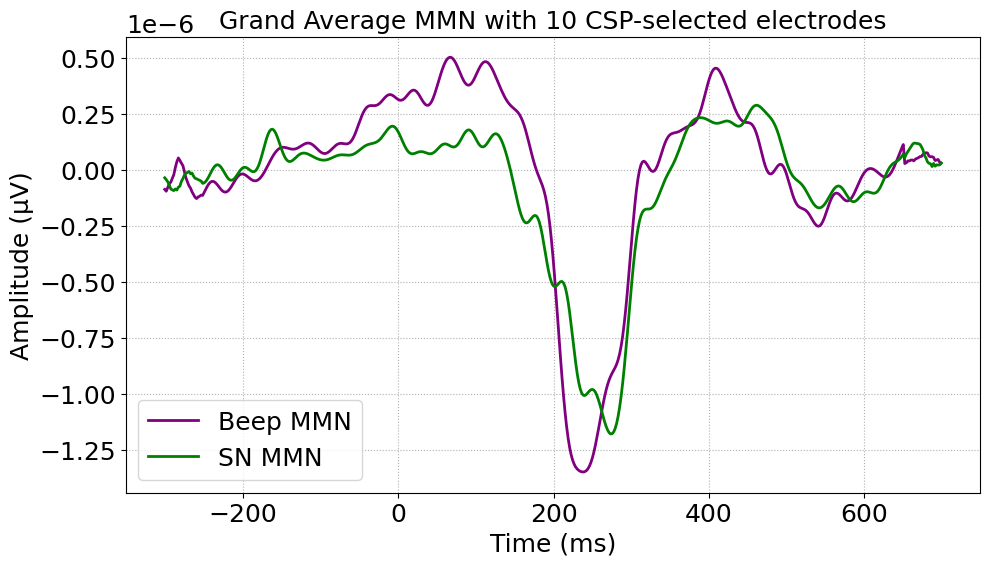

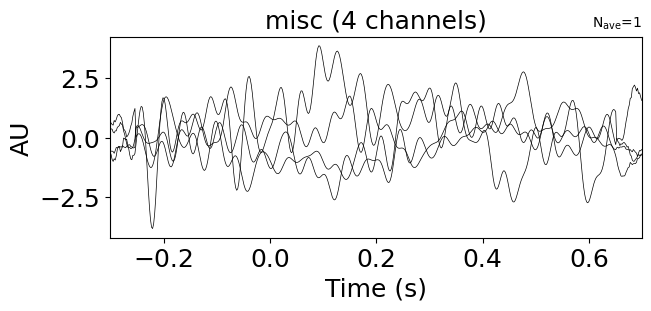

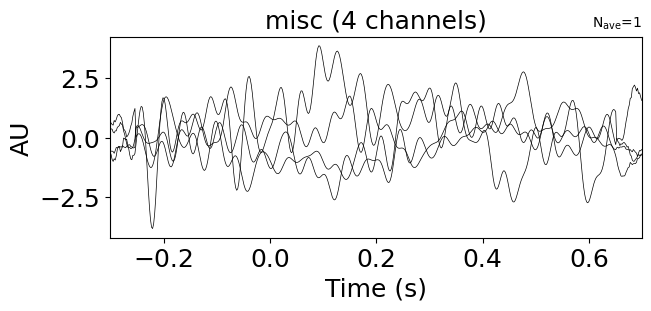

In [ ]:
# Example usage with your MMN evoked dictionaries
# Define time window capturing the peak MMN response (adjust based on your data)
time_window = (0.200, 0.400)  # 200-400 ms (based on your ERP plots)

# Apply CSP to find optimal spatial patterns 
csp_results = apply_csp_to_evoked_data(
    BN_MMN_evokeds_dict, 
    PN_MMN_evokeds_dict, 
    time_window=time_window,
    n_components=6  # Number of CSP components to use
)

# Get classification performance
print(f"Classification accuracy: {csp_results['mean_score']:.3f} ± {csp_results['std_score']:.3f}")

# Get top electrodes
top_electrodes = select_top_electrodes(csp_results['electrode_importance'], n_electrodes=10)
print("Top 10 electrodes:", top_electrodes)

# Visualize CSP patterns - use info from one of the subjects
example_subject = list(BN_MMN_evokeds_dict.keys())[0]
info = BN_MMN_evokeds_dict[example_subject].info
# #fig = visualize_csp_patterns(csp_results['patterns'], 
#                          csp_results['common_channels'],
#                          info,
#                          n_components=4)
#plt.show()

# Compare conditions using selected electrodes
fig, ax = compare_conditions_with_selected_electrodes(
    BN_MMN_evokeds_dict, 
    PN_MMN_evokeds_dict, 
    selected_channels=top_electrodes
)
plt.show()

# Apply full CSP transformation to a single subject's data (for visualization)
subject_id = example_subject
filtered_beep = apply_csp_filters_to_evoked(
    BN_MMN_evokeds_dict[subject_id],
    csp_results['filters'][:, :4],  # Use first 4 components
    csp_results['common_channels']
)

# Plot CSP-filtered data
filtered_beep.plot(picks='all')


# Type of audio stimuli

### PN duration base tone type 

C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_8968\3481413961.py:24: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evoked.EvokedArray'>.tmax (0.699219 s)
  evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in evoked_dict[cond]]
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_8968\3481413961.py:24: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evoked.EvokedArray'>.tmax (0.699219 s)
  evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in evoked_dict[cond]]
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_8968\3481413961.py:24: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evoked.EvokedArray'>.tmax (0.699219 s)
  evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in evoked_dict[cond]]
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_8968\3481413961.py:24: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evo

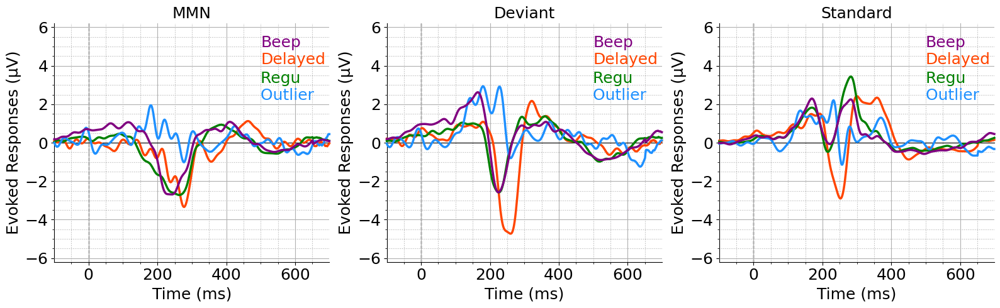

In [ ]:
delayed_tone = ['sub-sd012', 'sub-sd014', 'sub-sd016', 'sub-sd020', 'sub-sd027', 'sub-sd032', 'sub-sd033',
                 'sub-sd036', 'sub-sd038', 'sub-sd044', 'sub-sd051', 'sub-sd055', 'sub-sd067']
regu_tone = ['sub-sd011','sub-sd013', 'sub-sd015', 'sub-sd017', 'sub-sd018', 'sub-sd019', 'sub-sd021', 'sub-sd022', 'sub-sd023',
              'sub-sd024', 'sub-sd025', 'sub-sd026', 'sub-sd028', 'sub-sd029', 'sub-sd030', 'sub-sd031', 'sub-sd035', 'sub-sd037',
                'sub-sd041', 'sub-sd042', 'sub-sd043', 'sub-sd045', 'sub-sd046', 'sub-sd047', 'sub-sd048', 'sub-sd049', 'sub-sd052',
                  'sub-sd053', 'sub-sd054', 'sub-sd056', 'sub-sd057', 'sub-sd058', 'sub-sd060','sub-sd061','sub-sd062', 'sub-sd063', 'sub-sd064',
                    'sub-sd065', 'sub-sd066']


outliar_tone = ['sub-sd034', 'sub-sd039', 'sub-sd040', 'sub-sd050', 'sub-sd059'] 

dur_tone_groups = {
    'delayed_tone': delayed_tone,
    'regu_tone': regu_tone,
    'outliar_tone': outliar_tone,
}
tone_based_PN_MMN_evokes = {key: [] for key in dur_tone_groups}

# Assign evokeds to the appropriate group
for sub, evoked in PN_MMN_evokeds_dict.items():
    for group_name, subject_list in dur_tone_groups.items():
        if sub in subject_list:
            tone_based_PN_MMN_evokes[group_name].append(evoked)
            break


tone_based_BN_MMN_evokes = {key: [] for key in dur_tone_groups}

# Assign evokeds to the appropriate group
for sub, evoked in BN_MMN_evokeds_dict.items():
    for group_name, subject_list in dur_tone_groups.items():
        if sub in subject_list:
            tone_based_BN_MMN_evokes[group_name].append(evoked)
            break

tone_based_PN_devi_evokes = {key: [] for key in dur_tone_groups}

# Assign evokeds to the appropriate group
for sub, evoked in PN_devi_eps_evoked_dict.items():
    for group_name, subject_list in dur_tone_groups.items():
        if sub in subject_list:
            tone_based_PN_devi_evokes[group_name].append(evoked)
            break

tone_based_PN_std_evokes = {key: [] for key in dur_tone_groups}

# Assign evokeds to the appropriate group
for sub, evoked in PN_sta_eps_evoked_dict.items():
    for group_name, subject_list in dur_tone_groups .items():
        if sub in subject_list:
            tone_based_PN_std_evokes[group_name].append(evoked)
            break
stylesdict ={"delayed_tone": {"linewidth": 2.5,"linestyle":'solid','color' : 'orangered'},
             'regu_tone' : {"linewidth": 2.5,"linestyle":'solid','color' : 'green'},
             'outliar_tone': {"linewidth": 2.5,"linestyle":'solid','color' : 'dodgerblue'},
             "Beep": {"linewidth": 2.5,"linestyle":'solid','color' : 'purple'},
             }
text_labels = [
    (0.90, "Beep",'purple'),
    (0.83, f"Delayed",'orangered'),
    (0.75, f"Regu ",'green'),
    (0.68, f"Outlier ",'dodgerblue')
]
# Example usage with subplots
fig, axs = plt.subplots(1, 3, figsize=(16, 5), dpi=100)

# Define first ERP comparison
evokeds = tone_based_PN_MMN_evokes
evokeds["Beep"] = [evk for  sub,evk in BN_MMN_evokeds_dict.items() ]
plot_erps(evokeds, picks=[ 'Cz'],
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,ci=False,title="MMN",axs=axs[0])

# Define second ERP comparison
evokeds = tone_based_PN_devi_evokes
evokeds["Beep"] = [evk for  sub,evk in BN_devi_eps_evoked_dict.items() ]
plot_erps(evokeds, picks=[ 'Cz'],
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,ci=False,title="Deviant",axs=axs[1])


evokeds = tone_based_PN_std_evokes 
evokeds["Beep"] = [evk for  sub,evk in BN_sta_eps_evoked_dict.items() ]
plot_erps(evokeds, picks=[ 'Cz'],
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,ci=False,title="Standard",axs=axs[2])
plt.tight_layout()
plt.show()

### Different PN tone ERPs

C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_8968\3481413961.py:24: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evoked.EvokedArray'>.tmax (0.699219 s)
  evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in evoked_dict[cond]]
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_8968\3481413961.py:24: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evoked.EvokedArray'>.tmax (0.699219 s)
  evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in evoked_dict[cond]]
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_8968\3481413961.py:24: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evoked.EvokedArray'>.tmax (0.699219 s)
  evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in evoked_dict[cond]]
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_8968\3481413961.py:24: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evo

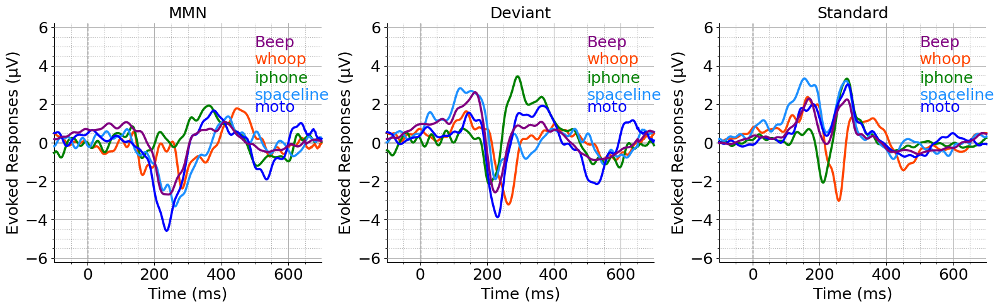

In [ ]:

whoop_tone = ['sub-sd012', 'sub-sd016','sub-sd036', 'sub-sd038' ,'sub-sd051','sub-sd067']
iphonr_tone = [ 'sub-sd019','sub-sd028', 'sub-sd031', 'sub-sd035','sub-sd043', 'sub-sd045','sub-sd052', 'sub-sd065',]
spaceLine_tone = ['sub-sd017', 'sub-sd026', 'sub-sd046', 'sub-sd047','sub-sd054','sub-sd063']
moto_tone = ['sub-sd011','sub-sd013',  'sub-sd018','sub-sd048','sub-sd056', ]


type_tone_groups = {
    'whoop_tone': whoop_tone,
    'iphonr_tone': iphonr_tone,
    'spaceLine_tone': spaceLine_tone,
    'moto_tone' :moto_tone,
}
type_tone_based_PN_MMN_evokes = {key: [] for key in type_tone_groups}

# Assign evokeds to the appropriate group
for sub, evoked in PN_MMN_evokeds_dict.items():
    for group_name, subject_list in type_tone_groups.items():
        if sub in subject_list:
            type_tone_based_PN_MMN_evokes[group_name].append(evoked)
            break


type_tone_based_BN_MMN_evokes = {key: [] for key in type_tone_groups}

# Assign evokeds to the appropriate group
for sub, evoked in BN_MMN_evokeds_dict.items():
    for group_name, subject_list in type_tone_groups.items():
        if sub in subject_list:
            type_tone_based_BN_MMN_evokes[group_name].append(evoked)
            break

type_tone_based_PN_devi_evokes = {key: [] for key in type_tone_groups}

# Assign evokeds to the appropriate group
for sub, evoked in PN_devi_eps_evoked_dict.items():
    for group_name, subject_list in type_tone_groups.items():
        if sub in subject_list:
            type_tone_based_PN_devi_evokes[group_name].append(evoked)
            break

type_tone_based_PN_std_evokes = {key: [] for key in type_tone_groups}

# Assign evokeds to the appropriate group
for sub, evoked in PN_sta_eps_evoked_dict.items():
    for group_name, subject_list in type_tone_groups.items():
        if sub in subject_list:
            type_tone_based_PN_std_evokes[group_name].append(evoked)
            break
stylesdict ={"whoop_tone": {"linewidth": 2.5,"linestyle":'solid','color' : 'orangered'},
             'iphonr_tone' : {"linewidth": 2.5,"linestyle":'solid','color' : 'green'},
             'spaceLine_tone': {"linewidth": 2.5,"linestyle":'solid','color' : 'dodgerblue'},
             "Beep": {"linewidth": 2.5,"linestyle":'solid','color' : 'purple'},
             "moto_tone": {"linewidth": 2.5,"linestyle":'solid','color' : 'blue'},
             }

type_tone_groups = {
    'whoop_tone': whoop_tone,
    'iphonr_tone': iphonr_tone,
    'spaceLine_tone': spaceLine_tone,
    'moto_tone' :moto_tone,
}
text_labels = [
    (0.90, "Beep",'purple'),
    (0.83, f"whoop",'orangered'),
    (0.75, f"iphone",'green'),
    (0.68, f"spaceline",'dodgerblue'),
    (0.63, f"moto",'blue')
]
# Example usage with subplots
fig, axs = plt.subplots(1, 3, figsize=(16, 5), dpi=100)

# Define first ERP comparison
evokeds = type_tone_based_PN_MMN_evokes
evokeds["Beep"] = [evk for  sub,evk in BN_MMN_evokeds_dict.items() ]
plot_erps(evokeds, picks=[ 'Cz'],
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,ci=False,title="MMN",axs=axs[0])

# Define second ERP comparison
evokeds = type_tone_based_PN_devi_evokes
evokeds["Beep"] = [evk for  sub,evk in BN_devi_eps_evoked_dict.items() ] 
plot_erps(evokeds, picks=[ 'Cz'],
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,ci=False,title="Deviant",axs=axs[1])


evokeds = type_tone_based_PN_std_evokes 
evokeds["Beep"] = [evk for  sub,evk in BN_sta_eps_evoked_dict.items() ] 
plot_erps(evokeds, picks=[ 'Cz'],
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,ci=False,title="Standard",axs=axs[2])
plt.tight_layout()
plt.show()

# Smartphone usage based group

In [ ]:
low_sub_D  = ['sd011', 'sd012', 'sd013', 'sd014', 'sd017', 'sd019', 'sd020', 'sd021', 'sd023', 'sd024', 'sd025', 'sd027', 'sd031',
               'sd032', 'sd043', 'sd044', 'sd045', 'sd046', 'sd047', 'sd048', 'sd052', 'sd053', 'sd057', 'sd060', 'sd061', 'sd063', 'sd064', 'sd065', 'sd067']
low_sub_D = ["sub-"+sub for sub in low_sub_D ]

high_sub_D = ['sd015', 'sd016', 'sd018', 'sd022', 'sd026', 'sd028', 'sd029', 'sd030', 'sd033', 'sd034', 'sd035', 'sd036', 'sd037',
               'sd038', 'sd039', 'sd040', 'sd041', 'sd042', 'sd049', 'sd050', 'sd051', 'sd054', 'sd055', 'sd056', 'sd058', 'sd059', 'sd062', 'sd066']
high_sub_D  = ["sub-"+sub for sub in high_sub_D  ]

### LSU and HSU MMN

In [ ]:
usage_groups = {
    'low sub': low_sub_D,
    'high sub': high_sub_D,
}
usage_groups_PN_MMN_evokes = {key: [] for key in usage_groups}

# Assign evokeds to the appropriate group
for sub, evoked in PN_MMN_evokeds_dict.items():
    for group_name, subject_list in usage_groups.items():
        
        if sub in subject_list:
            usage_groups_PN_MMN_evokes[group_name].append(evoked)
            break


usage_groups_BN_MMN_evokes = {key: [] for key in usage_groups}

# Assign evokeds to the appropriate group
for sub, evoked in BN_MMN_evokeds_dict.items():
    for group_name, subject_list in usage_groups.items():
        if sub in subject_list:
            usage_groups_BN_MMN_evokes[group_name].append(evoked)
            break

usage_groups_PN_devi_evokes = {key: [] for key in usage_groups}

# Assign evokeds to the appropriate group
for sub, evoked in PN_devi_eps_evoked_dict.items():
    for group_name, subject_list in usage_groups.items():
        if sub in subject_list:
            usage_groups_PN_devi_evokes[group_name].append(evoked)
            break

usage_groups_PN_std_evokes = {key: [] for key in usage_groups}

# Assign evokeds to the appropriate group
for sub, evoked in PN_sta_eps_evoked_dict.items():
    for group_name, subject_list in usage_groups.items():
        if sub in subject_list:
           usage_groups_PN_std_evokes[group_name].append(evoked)
           break

C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_8968\3481413961.py:24: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evoked.EvokedArray'>.tmax (0.699219 s)
  evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in evoked_dict[cond]]
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_8968\3481413961.py:24: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evoked.EvokedArray'>.tmax (0.699219 s)
  evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in evoked_dict[cond]]
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_8968\3481413961.py:24: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evoked.EvokedArray'>.tmax (0.699219 s)
  evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in evoked_dict[cond]]
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_8968\3481413961.py:24: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evo

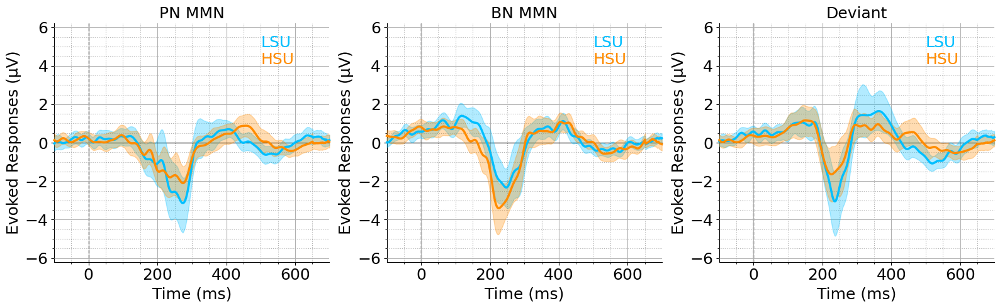

In [ ]:
stylesdict ={"low sub": {"linewidth": 2.5,"linestyle":'solid','color' : 'deepskyblue'}, 
             'high sub' : {"linewidth": 2.5,"linestyle":'solid','color' : 'darkorange'},
             }


text_labels = [
    (0.90, "LSU",'deepskyblue'),
    (0.83, f"HSU",'darkorange'),
]
# Example usage with subplots
fig, axs = plt.subplots(1, 3, figsize=(16, 5), dpi=100)

# Define first ERP comparison
evokeds = usage_groups_PN_MMN_evokes
plot_erps(evokeds, picks=[ 'Cz'],
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,title="PN MMN",axs=axs[0])

# Define second ERP comparison
evokeds = usage_groups_BN_MMN_evokes
plot_erps(evokeds, picks=[ 'Cz'],
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,title="BN MMN",axs=axs[1])


evokeds = usage_groups_PN_devi_evokes
plot_erps(evokeds, picks=[ 'Cz'],
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,title="Deviant",axs=axs[2])
plt.tight_layout()
plt.show()

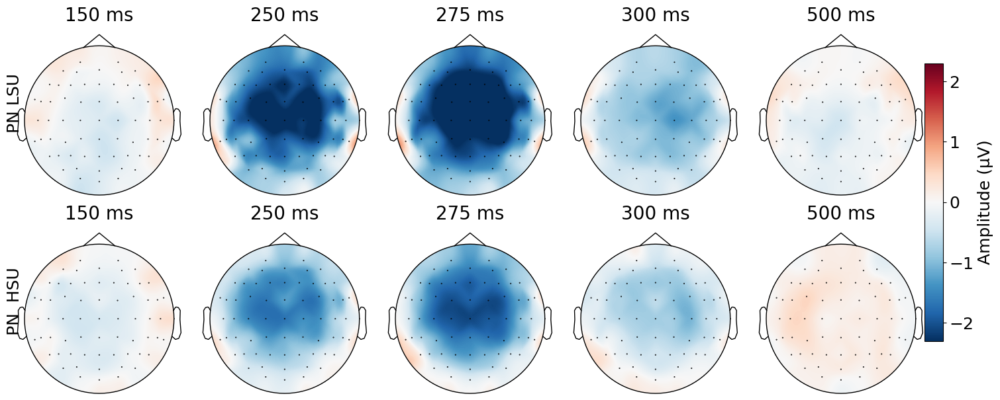

In [ ]:
# Define time points
time_points = [.150, .250,.275,.300,.5,]

# Set the color scale range
vlim = (-2.3, 2.3)  # Adjust based on your data

# Create a grid of subplots
fig, axes = plt.subplots(2, len(time_points), figsize=(14, 6), constrained_layout=True)

# To store the last 'im' object for the colorbar
im = None

# Plot topomaps for the first evoked (Personal_MMN_erp)
for i, time in enumerate(time_points):
    mne.grand_average(usage_groups_PN_MMN_evokes['low sub']).copy().plot_topomap(
        times=[time], axes=axes[0, i], colorbar=False, vlim=vlim, show=False,contours = 0,
    )
    axes[0, i].set_title(f"{time * 1000:.0f} ms",fontsize=20)

# Plot topomaps for the second evoked (B1_MMN_erp)
for i, time in enumerate(time_points):
    im= mne.grand_average(usage_groups_PN_MMN_evokes['high sub']).copy().plot_topomap(
        times=[time], axes=axes[1, i], colorbar=False, vlim=vlim, show=False,contours = 0,
    ) 
    axes[1, i].set_title(f"{time * 1000:.0f} ms",fontsize=20)

# Generate a shared colorbar
cbar_ax = fig.add_axes([0.99, 0.15, 0.02, 0.7])  # Position for the colorbar
norm = mpl.colors.Normalize(vmin=vlim[0], vmax=vlim[1])  # Normalize color scale
cmap = mpl.colormaps['RdBu_r']  # Choose a colormap (like 'RdBu_r')

# Add the colorbar
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
fig.colorbar(sm, cax=cbar_ax, orientation='vertical', label='Amplitude (µV)')

# Add row labels
fig.text(0.0001, 0.75, 'PN LSU', fontsize=18, rotation=90, va='center')
fig.text(0.0001, 0.25, 'PN  HSU', fontsize=18   , rotation=90, va='center')

plt.show()

## statistics analysis

### Mean Amplitude analysis Unpaired t-test

In [ ]:
def extract_peak_amplitude(evoked_dict, time_window, polarity='negative', channels=None):
    """
    Extract peak amplitude from evoked responses.
    
    Parameters:
    -----------
    evoked_dict : dict
        Dictionary with subject IDs as keys and evoked objects as values
    time_window : tuple
        Time window to search for peak
    polarity : str
        'negative' for MMN, 'positive' for positive components
    channels : list or None
        Specific channels to analyze
        
    Returns:
    --------
    dict
        Dictionary with subject IDs and their peak amplitudes
    """
    amplitudes = {}
    
    for subject_id, evoked in evoked_dict.items():
        # Select channels if specified
        if channels:
            evoked_copy = evoked.copy().pick_channels(channels)
        else:
            evoked_copy = evoked.copy()
        
        # Crop to time window
        evoked_cropped = evoked_copy.crop(tmin=time_window[0], tmax=time_window[1])
        
        # Get data and find peak
        data = np.mean(evoked_cropped.data, axis=0)  # Average across channels
        
        if polarity == 'negative':
            peak_amp = np.min(data)
        else:
            peak_amp = np.max(data)
            
        amplitudes[subject_id] = peak_amp
    
    return amplitudes


 Mean  Amplitude : t_stat [0.6479727] with , p_value [0.51990926]
 Peak Amplitude : t_stat 1.7112767683266918 with , p_value 0.09310637562231104


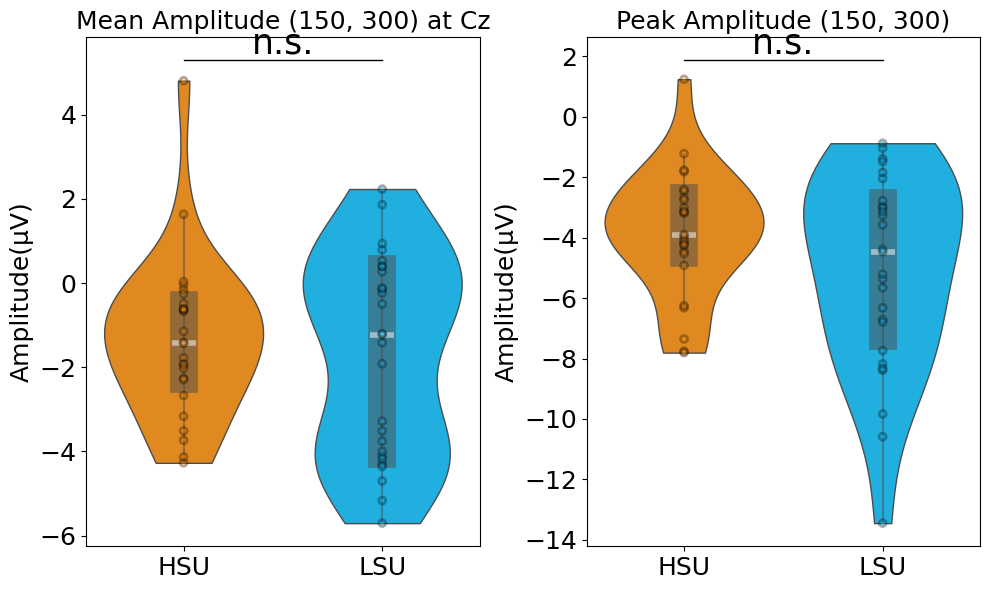

In [ ]:
df_type = "Amplitude"
label=("HSU", "LSU")
usage_groups_PN_MMN_evokes = {key: dict() for key in usage_groups}

# Assign evokeds to the appropriate group
for sub, evoked in PN_MMN_evokeds_dict.items():
    for group_name, subject_list in usage_groups.items():
        
        if sub in subject_list:
            usage_groups_PN_MMN_evokes[group_name][sub] = evoked
            break
HSU_amps_peak = np.array(list(extract_peak_amplitude(usage_groups_PN_MMN_evokes['high sub'],time_window = (.150, .300),channels=["Cz"]).values()))
LSU_amps_peak =np.array(list(extract_peak_amplitude(usage_groups_PN_MMN_evokes['low sub'],time_window = (.150, .300),channels=["Cz"]).values()))
time_window = (150, 300)  # MMN typically 100-250ms
channels = [ 'Cz']  # Common MMN channels
usage_groups = {
    'low sub': low_sub_D,
    'high sub': high_sub_D,
}

HSU_amps_mean = np.array([ np.mean(usage_groups_PN_MMN_evokes['high sub'][subject].copy().crop(tmin=time_window[0]/1000, 
                                                     tmax=time_window[1]/1000).get_data(picks=channels), axis=1) 
            if channels else  np.mean(usage_groups_PN_MMN_evokes['high sub'][subject].copy().crop(tmin=time_window[0]/1000, 
                                                     tmax=time_window[1]/1000).get_data(), axis=1) 
            for subject in usage_groups_PN_MMN_evokes['high sub']])
LSU_amps_mean = np.array([ np.mean(usage_groups_PN_MMN_evokes['low sub'][subject].copy().crop(tmin=time_window[0]/1000, 
                                                     tmax=time_window[1]/1000).get_data(picks=channels), axis=1) 
            if channels else  np.mean(usage_groups_PN_MMN_evokes['low sub'][subject].copy().crop(tmin=time_window[0]/1000, 
                                                     tmax=time_window[1]/1000).get_data(), axis=1) 
            for subject in usage_groups_PN_MMN_evokes['low sub']])

#df = df_convert(HSU_amps, LSU_amps,label=("SN", "BN") )
df  = pd.DataFrame({
        df_type: np.concatenate([HSU_amps_mean.flatten()*1e+6, LSU_amps_mean.flatten()*1e+6]),
        'Case': np.repeat([label[0], label[1]], [HSU_amps_mean.shape[0], LSU_amps_mean.shape[0]]),

    })
    
fig, ax = plt.subplots(1,2 , figsize=(10,6), )
sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=['darkorange','deepskyblue'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[0] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=['darkorange','deepskyblue'], edgecolor='black',dodge=False,ax= ax[0])

y_offset = 1.e-09
y_max = max(df[df_type]) *1.1
t_stat, p_value = stats.ttest_ind(HSU_amps_mean, LSU_amps_mean)
print(f' Mean  Amplitude : t_stat {t_stat } with , p_value { p_value}')

ax[0].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax[0].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[0].set_title(f"Mean Amplitude {time_window} at {channels[0]}", fontsize=18)
ax[0].set_xlabel("")
ax[0].set_ylabel(df_type+"(µV)" )
#ax.set_xticklabels(["PN", "BN"])


# Fraction area plot 
df  = pd.DataFrame({
        df_type: np.concatenate([HSU_amps_peak.flatten()*1e+6, LSU_amps_peak.flatten()*1e+6]),
        'Case': np.repeat([label[0], label[1]], [HSU_amps_peak.shape[0], LSU_amps_peak.shape[0]]),

    })

sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=['darkorange','deepskyblue'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[1] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=['darkorange','deepskyblue'], edgecolor='black',dodge=False,ax= ax[1])

y_offset = 1.e-09 
y_max = max(df[df_type]) *1.5
t_stat, p_value = stats.ttest_ind(HSU_amps_peak, LSU_amps_peak)
print(f' Peak Amplitude : t_stat {t_stat } with , p_value { p_value}')
ax[1].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax[1].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[1].set_title(f"Peak Amplitude {time_window}", fontsize=18)
ax[1].set_xlabel("")
ax[1].set_ylabel(df_type +"(µV)")
#ax.set_xticklabels(["PN", "BN"])
ax[0].ticklabel_format(style='plain', axis='y')
plt.tight_layout()
plt.show()

### Latency analysis

In [ ]:
def unpaired_extract_mmn_latencies(case1_dict, time_window=(100, 300), channels=None, 
                          method='peak', fractional_area=0.50):
    """Extract MMN latencies using specified method."""
    time_axis = None  # Will be determined from the first subject's data
    
    latencies_case1 = []
  
    for subject in case1_dict:
        # Get the MMN evoked data for selected channels
        if channels:
            case1_data = case1_dict[subject].copy().pick_channels(channels)
        else:
            case1_data = case1_dict[subject].copy()
        
        # Extract the time axis if not yet done
        if time_axis is None:
            time_axis = case1_data.times
            
        # Crop to time window of interest
        case1_data = case1_data.copy().crop(tmin=time_window[0]/1000, tmax=time_window[1]/1000)
        
        # Get the data as numpy arrays - average across selected channels
        case1_avg = np.mean(case1_data.data, axis=0) if len(case1_data.data.shape) > 1 else case1_data.data
        
        # Get the time axis for this window
        window_times = case1_data.times
        
        # Extract latency based on the selected method 
        if method == 'peak':
            # Find the peak latency (time of max negative amplitude)
            peak_idx1 = np.argmin(case1_avg)
            lat1 = window_times[peak_idx1] * 1000  # Convert to ms
            
        elif method == 'fractional_area':
            # Fractional area latency (more robust against noise)
            lat1 = get_fractional_area_latency(case1_avg, window_times, fractional_area) * 1000
            
        elif method == 'onset':
            # Onset latency (when amplitude reaches a percentage of peak)
            percent_threshold = 0.50  # Typically 50% of peak amplitude
            lat1 = get_onset_latency(case1_avg, window_times, percent_threshold) * 1000
            
        latencies_case1.append(lat1)
    
    return np.array(latencies_case1)


Peak latency ;- t_stat -1.0105605278006733 with , p_value 0.316997438606867
Fractional area (50 %) latency ;- t_stat -0.3651760040519035 with , p_value 0.7165202607224317


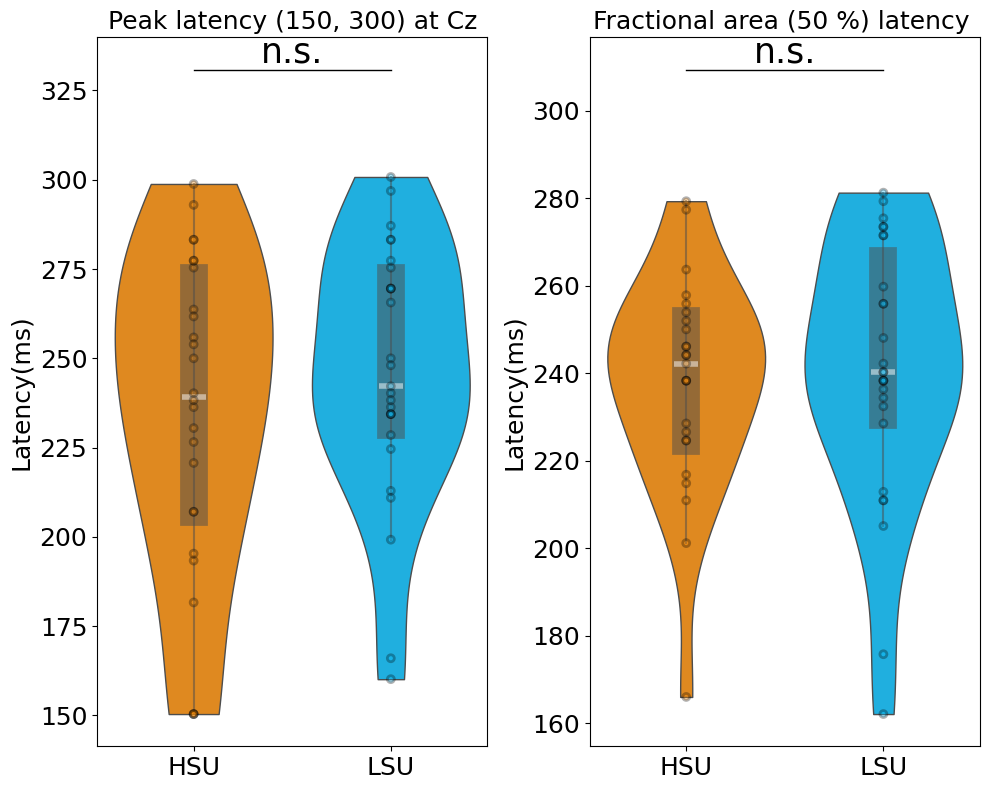

In [ ]:
time_window = (150, 300)   # ms - typical MMN window
channels =["Cz"] # Typical frontocentral electrodes for MMN

peak_high_lat = unpaired_extract_mmn_latencies(usage_groups_PN_MMN_evokes['high sub'] , time_window=time_window,channels=channels, method='peak')
peak_low_lat = unpaired_extract_mmn_latencies(usage_groups_PN_MMN_evokes['low sub'] , time_window=time_window,channels=channels, method='peak')

area_high_lat = unpaired_extract_mmn_latencies(usage_groups_PN_MMN_evokes['high sub'] , time_window=time_window,channels=channels, method='fractional_area', fractional_area=0.50)
area_low_lat = unpaired_extract_mmn_latencies(usage_groups_PN_MMN_evokes['low sub'] , time_window=time_window,channels=channels, method='fractional_area', fractional_area=0.50)

# Extract Latency
df_type = "Latency"
label=("HSU", "LSU")
# Set up the plot
df  = pd.DataFrame({
        df_type: np.concatenate([peak_high_lat, peak_low_lat ]),
        'Case': np.repeat([label[0], label[1]], [peak_high_lat.shape[0], peak_low_lat.shape[0]]),

    })
df[df_type] = df[df_type]
fig, ax = plt.subplots(1,2 , figsize=(10,8), )
sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=['darkorange','deepskyblue'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[0] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=['darkorange','deepskyblue'], edgecolor='black',dodge=False,ax= ax[0])

y_offset = 1.e-09
y_max = max(df[df_type]) *1.1
t_stat, p_value = stats.ttest_ind(peak_high_lat, peak_low_lat)
print(f'Peak latency ;- t_stat {t_stat } with , p_value { p_value}')
ax[0].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax[0].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[0].set_title(f"Peak latency {time_window} at {channels[0]}", fontsize=18)
ax[0].set_xlabel("")
ax[0].set_ylabel(df_type + '(ms)')
#ax.set_xticklabels(["PN", "BN"])


# Fraction area plot 
#df = df_convert(area_high_lat, area_low_lat ,label=("SN", "BN"),df_type = df_type)
df  = pd.DataFrame({
        df_type: np.concatenate([area_high_lat, area_low_lat]),
        'Case': np.repeat([label[0], label[1]], [peak_high_lat.shape[0], peak_low_lat.shape[0]]),

    })
df[df_type] = df[df_type]

sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=['darkorange','deepskyblue'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[1] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=['darkorange','deepskyblue'], edgecolor='black',dodge=False,ax= ax[1])

y_offset = 1.e-09 
y_max = max(df[df_type]) *1.1
t_stat, p_value = stats.ttest_ind(area_high_lat[~np.isnan(area_high_lat)], area_low_lat[~np.isnan(area_low_lat)])
print(f'Fractional area (50 %) latency ;- t_stat {t_stat } with , p_value { p_value}')

ax[1].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax[1].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[1].set_title(f"Fractional area (50 %) latency ", fontsize=18)
ax[1].set_xlabel("")
ax[1].set_ylabel(df_type + '(ms)'  )
#ax.set_xticklabels(["PN", "BN"])
plt.tight_layout()
plt.show()

In [ ]:
t_stat, p_value = stats.ttest_ind(area_high_lat, area_low_lat)
t_stat, p_value 

(nan, nan)